<a href="https://colab.research.google.com/github/alaeddinehamroun/Working-with-GANs/blob/main/Getting_Started_with_GANs_Generate_hand_written_images_of_digits.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Imports

In [1]:
import torch # Using pytorch for this one
from torch import nn
from tqdm.auto import tqdm # to show a smart progress meter for any iterable
from torchvision import transforms # The torchvision package consists of popular datasets, model architectures, and common image transformations for computer vision.
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

### Utils

In [15]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
  '''
  Function for visualizing images: Given a tensor of images, number of images, 
  and size per image, plots and prints the images in a uniform grid.
  '''
  image_unflat = image_tensor.detach().cpu().view(-1, *size)
  image_grid = make_grid(image_unflat[:num_images], nrow=5)
  plt.imshow(image_grid.permute(1, 2, 0).squeeze())
  plt.show()

### Build the Generator

In [3]:
# make a single layer/block for the generator's neural network
def get_generator_block(input_dim, output_dim):
  '''
  Function for returning a block of the generator's neural network
  given input and output dimensions.
  Parameter:
      input_dim: the dimension of the input vector, a scalar
      output_dim: the dimension of the output vector, a scalar
  Returns:
      a generator neural network layer, with a linear transformation
      followed by a batch normalization and then a relu activation
  '''
  return nn.Sequential(
      nn.Linear(input_dim, output_dim),
      nn.BatchNorm1d(output_dim),
      nn.ReLU(inplace=True)
  )

The generator will build a neural network with 5 layers/blocks. Beginning with the noise vector, the generator will apply non-linear transformations via the block function until the tensor is mapped to the size of the image to be outputted (the same size as the real images from MNIST). The final layer does not need a normalization or activation function, but does need to be scaled with a sigmoid function.

In [4]:
class Generator(nn.Module):
  '''
  Generator Class
  Values:
      z_dim: the dimension of the noise vector, a scalar
      im_dim: the dimension of the images, fitted for the dataset used, a scalar
      hidden_dim: the inner dimension, a scalar
  '''
  def __init__(self, z_dim=10, im_dim=784, hidden_dim=128): #784 = 28*28
    super(Generator, self).__init__()
    # Build the neural network
    self.gen = nn.Sequential(
        get_generator_block(z_dim, hidden_dim),
        get_generator_block(hidden_dim, hidden_dim*2),
        get_generator_block(hidden_dim*2, hidden_dim*4),
        get_generator_block(hidden_dim*4, hidden_dim*8),
        nn.Linear(hidden_dim*8, im_dim),
        nn.Sigmoid()
    )
  def forward(self, noise):
    '''
    Function for completing a forward pass of the generator: Given a noise tensor,
    returns generated images.
    Parameters:
        noise: a noise tensor with dimensions (n_samples, z_dim)
    '''
    return self.gen(noise)

### Noise

In [5]:
def get_noise(n_samples, z_dim, device='cpu'):
  '''
  Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
  creates a tensor of that shape filled with random numbers from the normal distribution.
  Parameters:
      n_samples: the number of samples to generate, a scalar
      z_dim: the dimension of the noise vector, a scalar
      device: the device type
  '''
  return torch.randn(n_samples, z_dim).to(device)

### Discriminator

In [6]:
def get_discriminator_block(input_dim, output_dim):
  '''
  Discriminator Block
  Function for returning a neural network of the discriminator given input and output dimensions.
  Parameters:
      input_dim: the dimension of the input vector, a scalar
      output_dim: the dimension of the output vector, a scalar
  Returns:
      a discriminator neural network layer, with a linear transformation
      followed by an nn.LeakyReLU activation with negative slope of 0.2
  '''
  return nn.Sequential(
      nn.Linear(input_dim, output_dim),
      nn.LeakyReLU(0.2) # to prevent the "dying ReLU"(=params stop changing due to consistently negative values passed to a ReLU, which result in a zero gradient)
  )

The discriminator will build a neural network with 4 layers. It will start with the image tensor and transform it until it returns a single number (1-dimension tensor) output. This output classifies whether an image is fake or real. 

In [7]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            nn.Linear(hidden_dim, 1)
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)

### Training

In [8]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss() # The loss function
n_epochs = 200 # The number of times you iterate through the entire dataset when training
z_dim = 64 # The dimension of the noise vector
display_step = 500 # how often to display/visualize the images
batch_size = 128 # The number of images per forward/backward pass
lr = 0.00001 # The learning rate

# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

device = 'cuda' # The device type, here using a GPU (which runs CUDA), not CPU

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [9]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [12]:
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
  '''
  Return the loss of the discriminator given inputs.
  Parameters:
      gen: the generator model, which returns an image given z-dimensional noise
      disc: the discriminator model, which returns a single-dimensional prediction of real/fake
      criterion: the loss function, which should be used to compare the discriminator's predictions to the ground truth reality of the images
                  (e.g. fake = 0, real = 1)
      real: a batch of real images
      num_images: the number of images the generator should produce, which is also the length of the real images
      z_dim: the dimension oof the noise vector, a scalar
      device: the device type
    Returns:
      disc_loss: a torch scalar loss value for the current batch
  '''
  noise = get_noise(num_images, z_dim, device)
  fake = gen(noise)
  disc_fpred = disc(fake.detach())
  disc_floss = criterion(disc_fpred, torch.zeros_like(disc_fpred))
  disc_rpred = disc(real)
  disc_rloss = criterion(disc_rpred, torch.ones_like(disc_rpred))
  disc_loss = (disc_floss + disc_rloss) / 2
  
  return disc_loss

In [13]:
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
  '''
  Return the loss of the generator given inputs.
  Parameters:
      gen: the generator model, which returns an image given z-dimensional noise
      disc: the discriminator model, which returns a single-dimensional prediction of real/fake
      criterion: the loss function, which should be used to compare 
            the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
      num_images: the number of images the generator should produce, 
              which is also the length of the real images
      z_dim: the dimension of the noise vector, a scalar
      device: the device type
  Returns:
      gen_loss: a torch scalar loss value for the current batch
    '''
  fake_noise = get_noise(num_images, z_dim, device=device)
  fake = gen(fake_noise)
  disc_fake_pred = disc(fake)
  gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
  return gen_loss

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: 1.708640769958496, discriminator loss: 0.2907332400381568


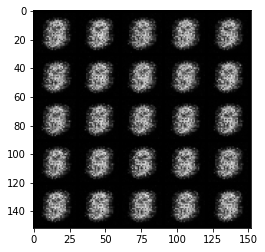

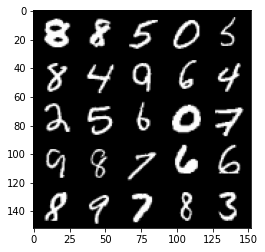

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1000: Generator loss: 1.9709943802356713, discriminator loss: 0.169443243175745


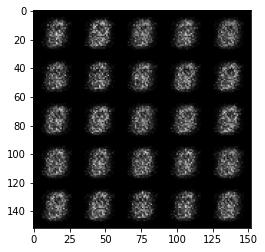

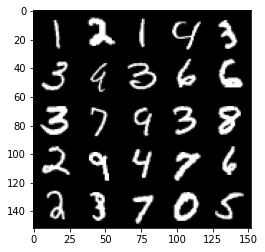

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1500: Generator loss: 1.755914403676987, discriminator loss: 0.19614396110177038


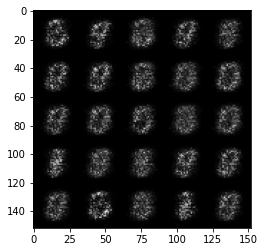

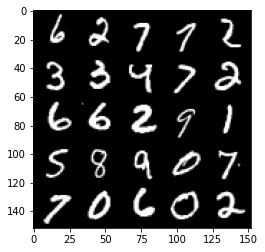

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2000: Generator loss: 1.6992085402011878, discriminator loss: 0.20310456874966606


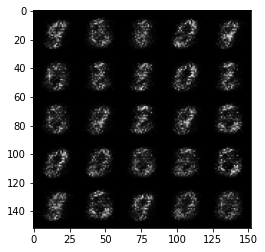

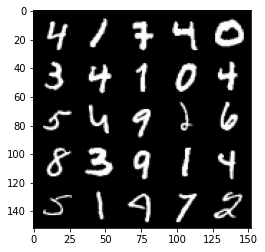

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2500: Generator loss: 1.922397913455962, discriminator loss: 0.17548853170871723


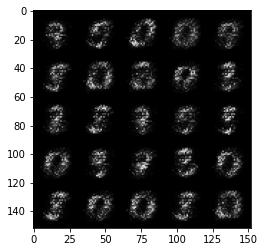

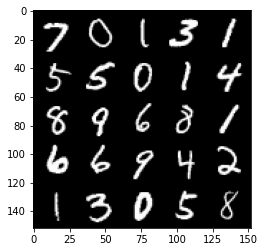

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3000: Generator loss: 2.306309908151625, discriminator loss: 0.15523274812102303


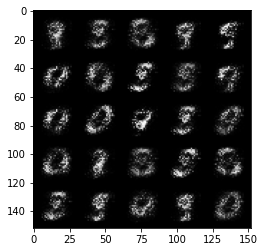

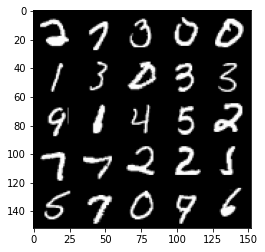

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3500: Generator loss: 2.5694517340660115, discriminator loss: 0.12702285483479506


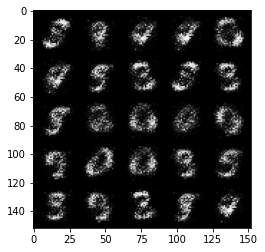

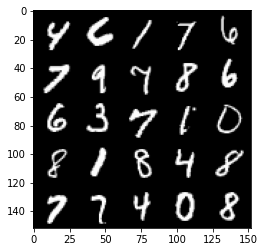

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4000: Generator loss: 3.0277883105278005, discriminator loss: 0.10129391857981679


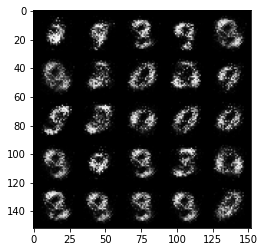

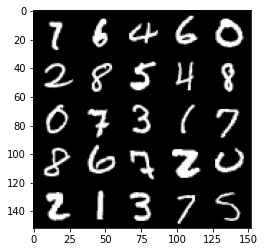

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4500: Generator loss: 3.22336382246017, discriminator loss: 0.09955717167258267


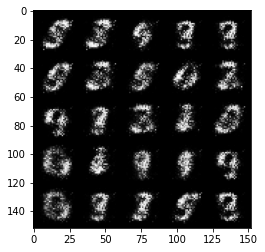

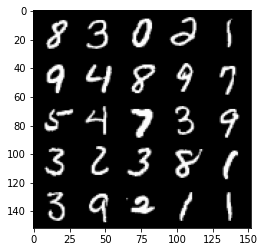

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5000: Generator loss: 3.383180891036987, discriminator loss: 0.09370882625132794


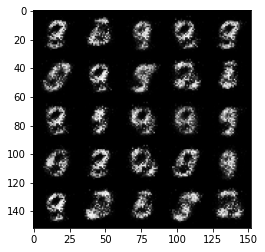

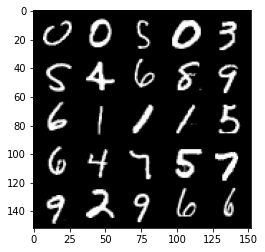

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5500: Generator loss: 3.587459484577181, discriminator loss: 0.0805966404825448


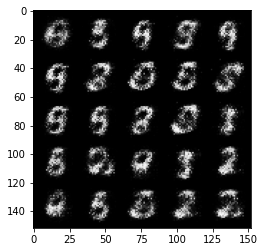

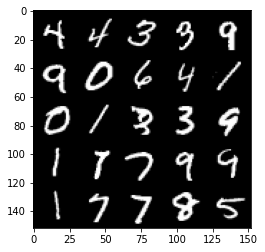

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6000: Generator loss: 3.8135803170204143, discriminator loss: 0.06211596828699113


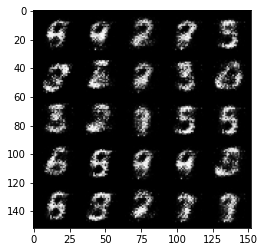

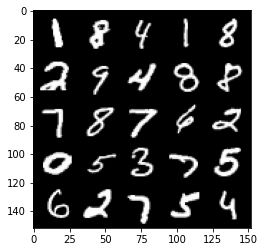

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6500: Generator loss: 3.9720783090591434, discriminator loss: 0.054363411836326134


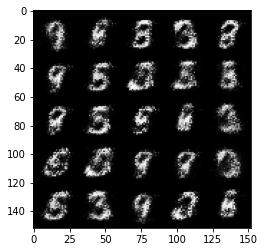

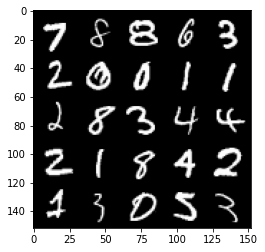

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7000: Generator loss: 3.767344929695131, discriminator loss: 0.0757927062287927


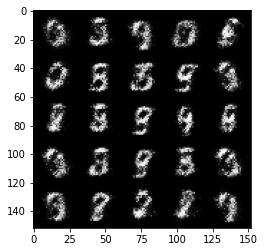

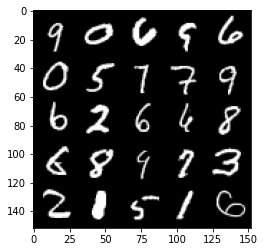

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7500: Generator loss: 3.88497325563431, discriminator loss: 0.0657134292498231


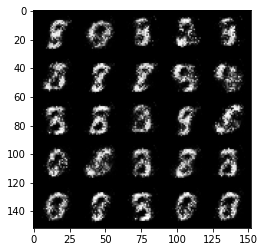

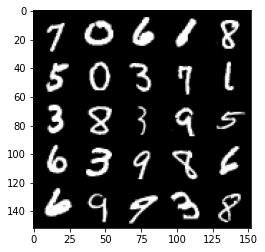

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8000: Generator loss: 3.9628865108489983, discriminator loss: 0.07834995220601562


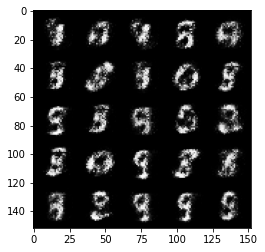

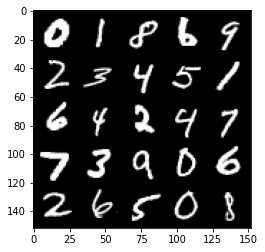

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8500: Generator loss: 3.9406060690879854, discriminator loss: 0.07063588588684797


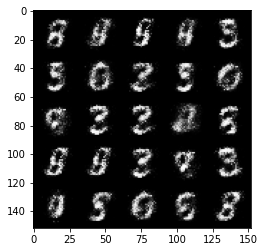

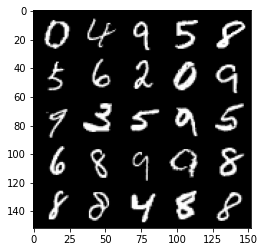

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9000: Generator loss: 3.964610567569734, discriminator loss: 0.06972138670086861


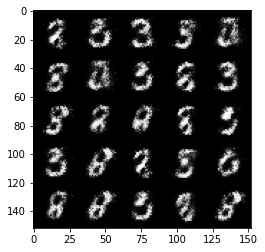

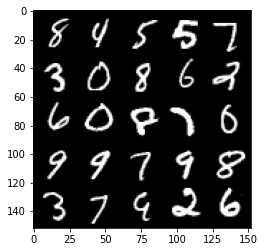

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9500: Generator loss: 4.04622813606262, discriminator loss: 0.06590898872911925


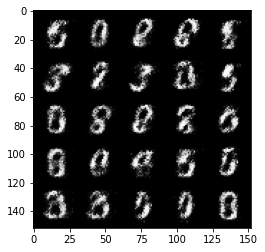

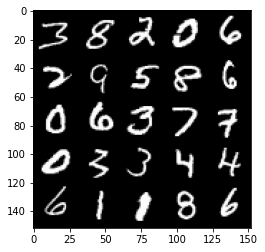

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10000: Generator loss: 3.890440469741824, discriminator loss: 0.07476872460544114


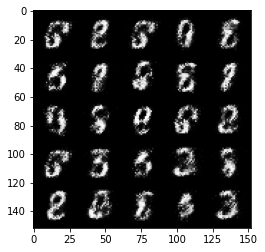

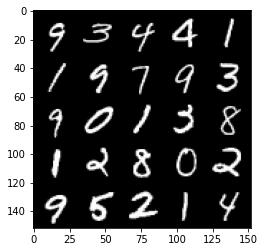

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10500: Generator loss: 3.974117395400996, discriminator loss: 0.08149456761777399


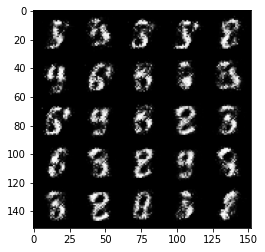

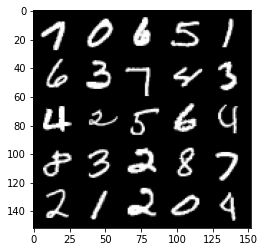

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11000: Generator loss: 3.913483812332154, discriminator loss: 0.08400977732241159


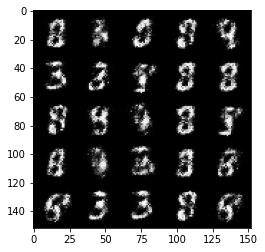

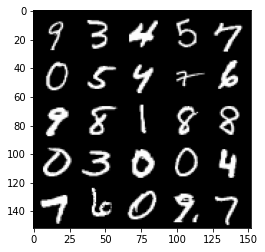

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11500: Generator loss: 3.8015001330375693, discriminator loss: 0.0896052690893412


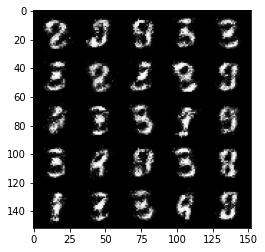

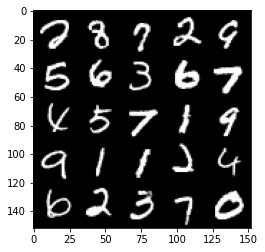

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12000: Generator loss: 3.8586903624534608, discriminator loss: 0.09289435523003338


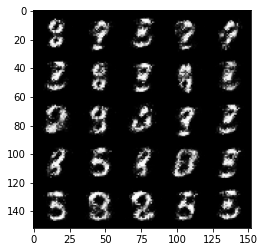

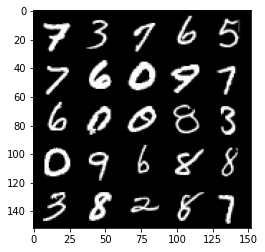

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12500: Generator loss: 3.8165969576835623, discriminator loss: 0.09751654570549732


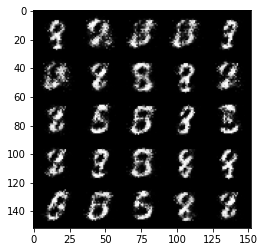

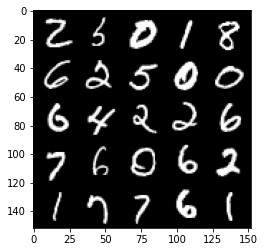

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13000: Generator loss: 4.013019240379333, discriminator loss: 0.09889142087101939


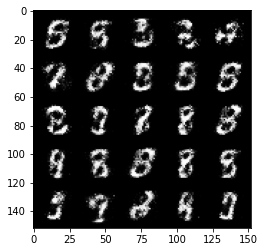

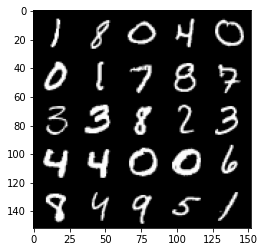

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13500: Generator loss: 3.8532623047828687, discriminator loss: 0.10202283843606708


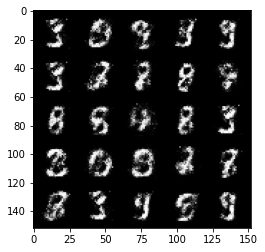

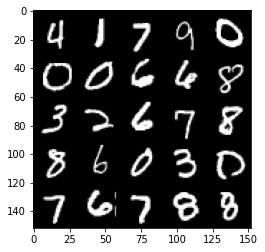

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14000: Generator loss: 3.877642198085785, discriminator loss: 0.11212376205623144


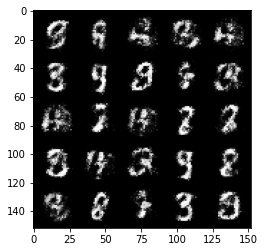

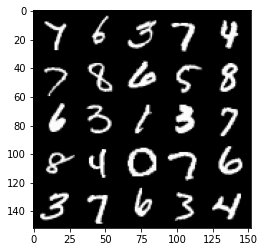

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14500: Generator loss: 3.7277586760521007, discriminator loss: 0.12040601754188535


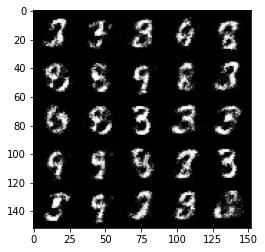

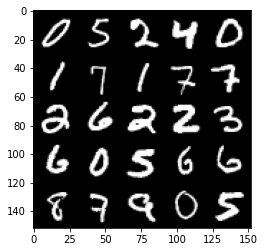

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15000: Generator loss: 3.7139627561569224, discriminator loss: 0.11516276968270547


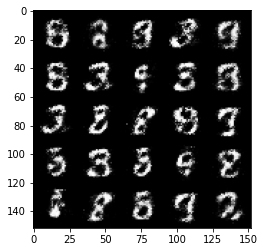

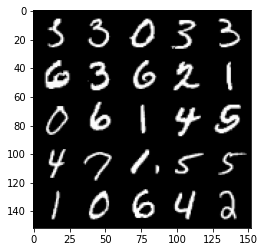

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15500: Generator loss: 3.8076265258789093, discriminator loss: 0.10908177474886184


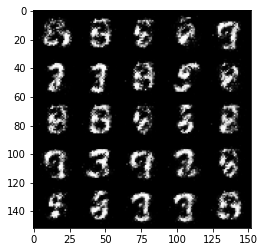

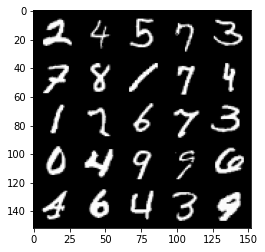

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16000: Generator loss: 3.719888925552368, discriminator loss: 0.11611043579131372


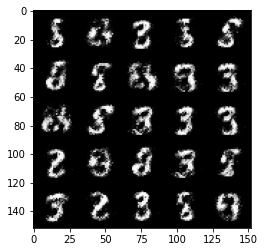

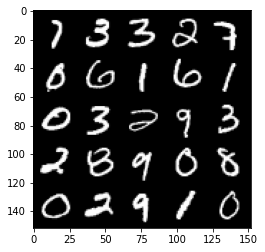

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16500: Generator loss: 3.703928444862367, discriminator loss: 0.11369893002510069


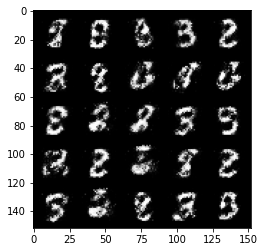

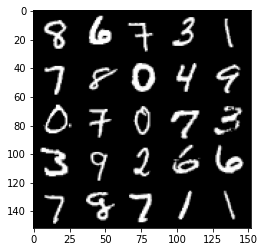

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17000: Generator loss: 3.4823734269142093, discriminator loss: 0.13478457914292816


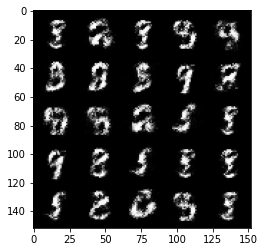

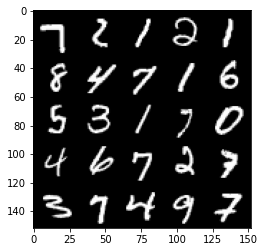

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17500: Generator loss: 3.453903421401976, discriminator loss: 0.13018232905864716


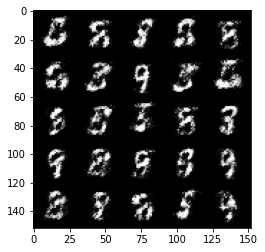

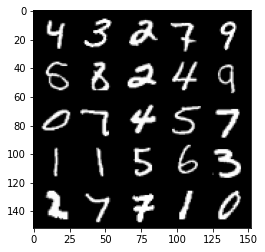

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18000: Generator loss: 3.515227650165556, discriminator loss: 0.13458888794481752


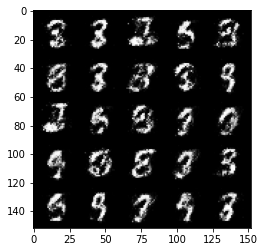

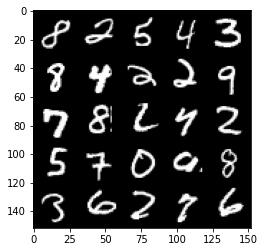

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18500: Generator loss: 3.47366953420639, discriminator loss: 0.13209660206735127


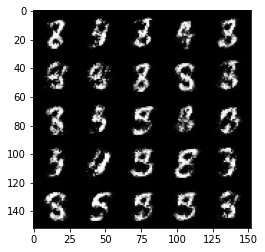

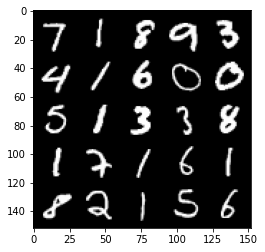

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19000: Generator loss: 3.5077599411010736, discriminator loss: 0.13152858221530914


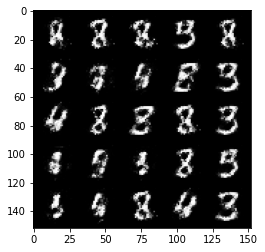

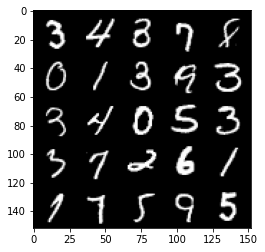

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19500: Generator loss: 3.3813211741447464, discriminator loss: 0.14981675252318372


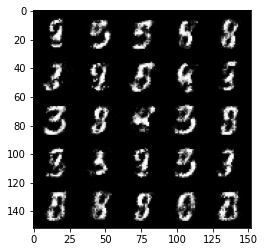

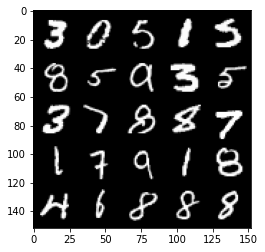

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20000: Generator loss: 3.112688173770902, discriminator loss: 0.16004341828823107


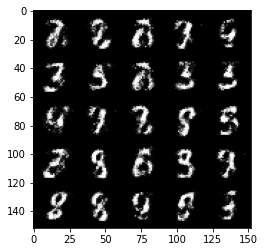

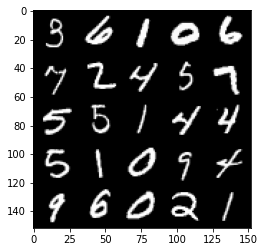

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20500: Generator loss: 3.2070879936218257, discriminator loss: 0.15851648536324514


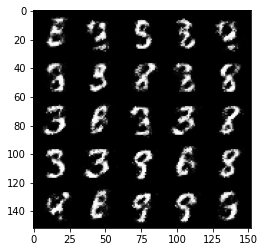

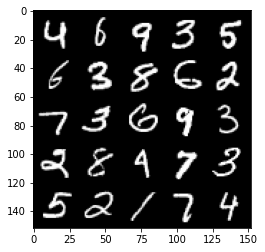

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21000: Generator loss: 3.1467734308242825, discriminator loss: 0.16453535521030427


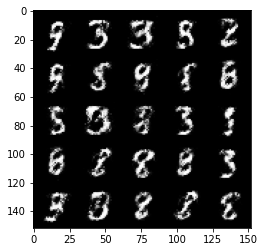

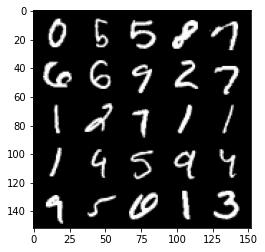

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21500: Generator loss: 3.0070003390312174, discriminator loss: 0.17803480024635793


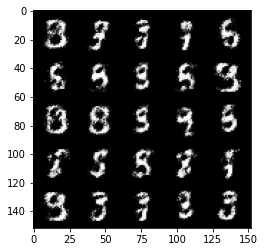

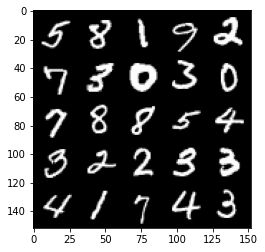

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22000: Generator loss: 2.978704673290253, discriminator loss: 0.1696881712824108


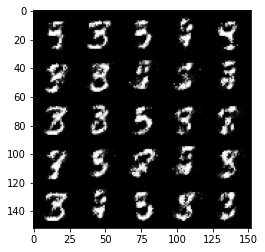

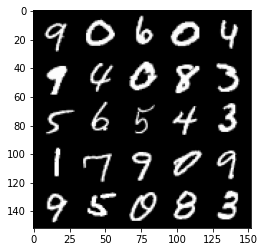

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22500: Generator loss: 3.1346784048080445, discriminator loss: 0.1609597947895527


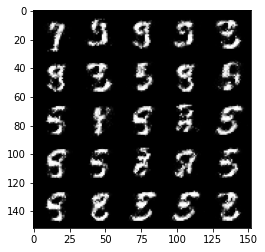

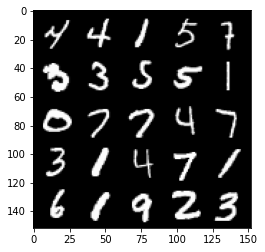

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23000: Generator loss: 2.9992868995666515, discriminator loss: 0.17060103797912596


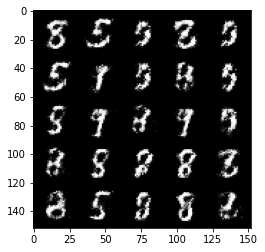

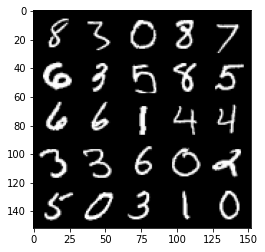

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23500: Generator loss: 3.0765520215034483, discriminator loss: 0.16498641951382167


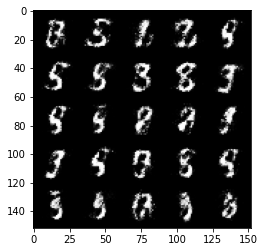

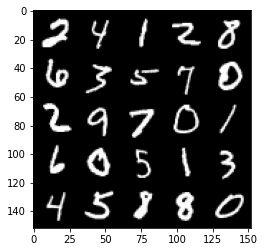

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24000: Generator loss: 2.9768754787445104, discriminator loss: 0.1728139657378197


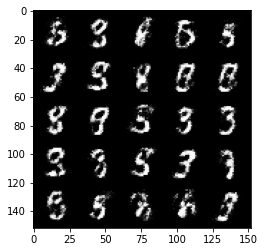

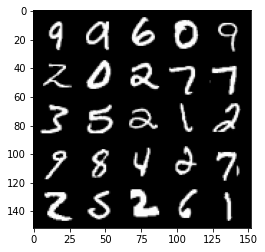

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24500: Generator loss: 2.932670582294469, discriminator loss: 0.19937521423399462


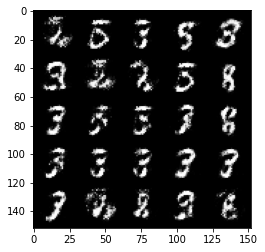

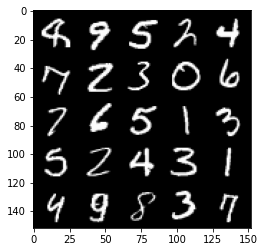

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25000: Generator loss: 2.8693437933921837, discriminator loss: 0.1765405434072015


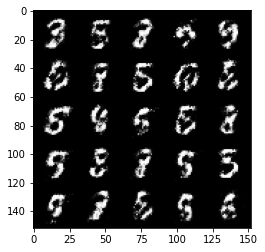

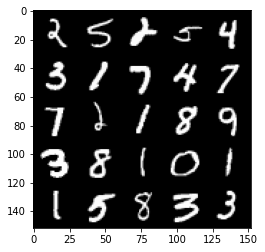

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25500: Generator loss: 2.9673450813293445, discriminator loss: 0.1713604674339294


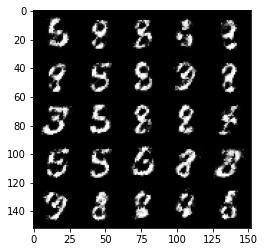

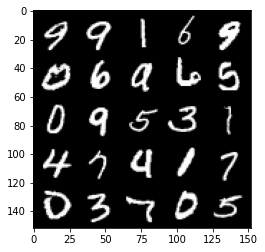

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26000: Generator loss: 2.812053552627565, discriminator loss: 0.20173683473467804


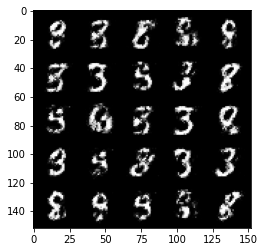

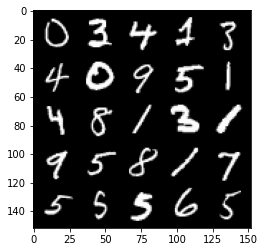

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26500: Generator loss: 2.7401680688858048, discriminator loss: 0.21042417640984062


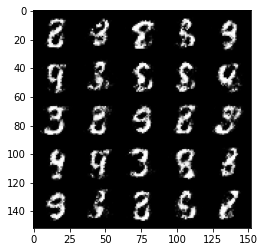

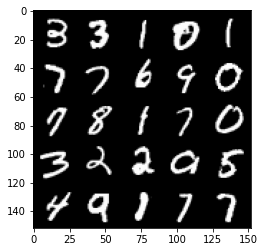

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27000: Generator loss: 2.7202102909088115, discriminator loss: 0.21263649037480362


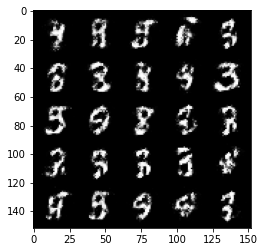

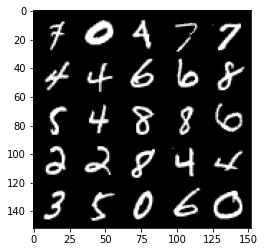

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27500: Generator loss: 2.605230768680574, discriminator loss: 0.2359144307374956


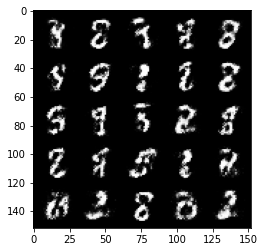

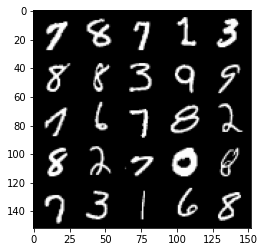

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28000: Generator loss: 2.631528617858885, discriminator loss: 0.2138016918301583


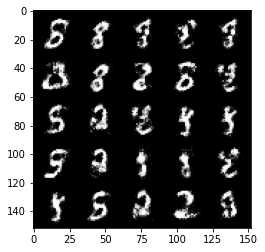

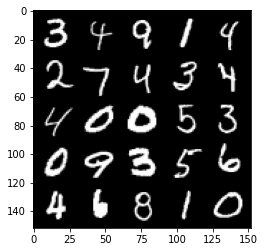

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28500: Generator loss: 2.6239806113243094, discriminator loss: 0.22919033251702772


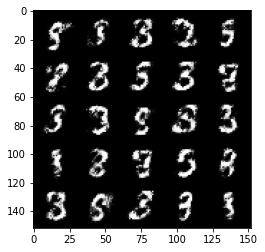

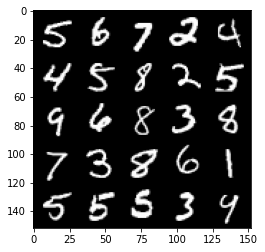

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29000: Generator loss: 2.578702567577358, discriminator loss: 0.23463214959204196


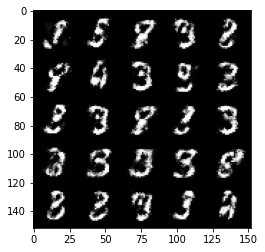

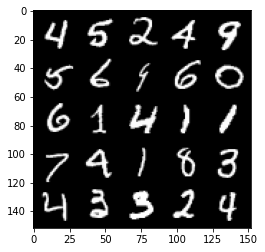

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29500: Generator loss: 2.531935409069062, discriminator loss: 0.24316458693146725


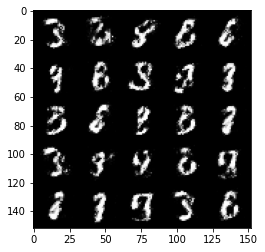

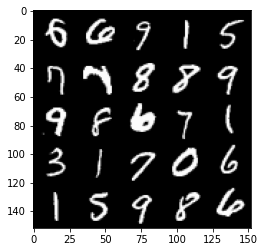

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30000: Generator loss: 2.410447011947628, discriminator loss: 0.25442270970344555


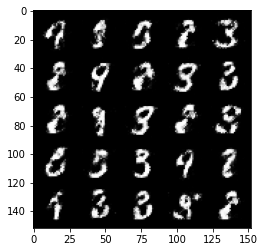

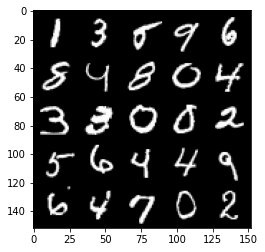

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30500: Generator loss: 2.5473789558410633, discriminator loss: 0.23583076316118218


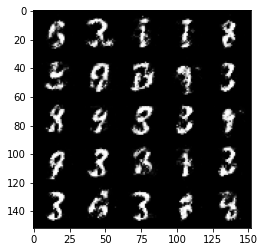

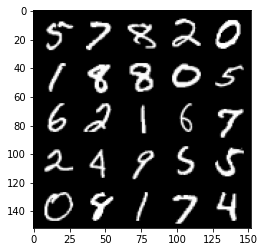

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31000: Generator loss: 2.3526366679668445, discriminator loss: 0.2599726702570915


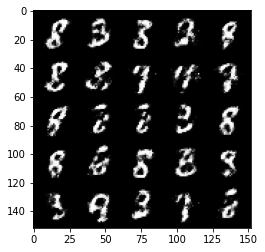

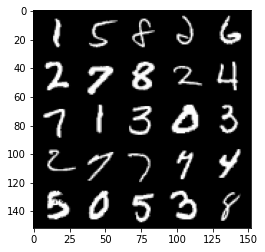

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31500: Generator loss: 2.4806701698303235, discriminator loss: 0.22534884878993033


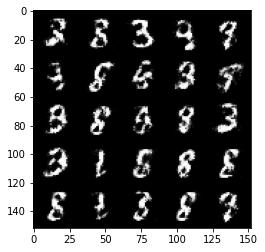

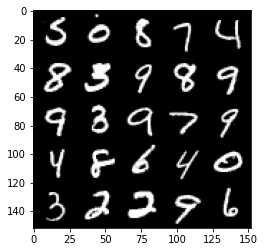

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32000: Generator loss: 2.4498978719711277, discriminator loss: 0.24635295209288605


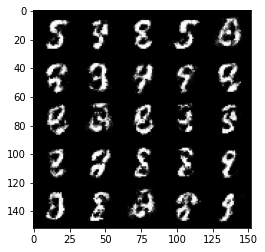

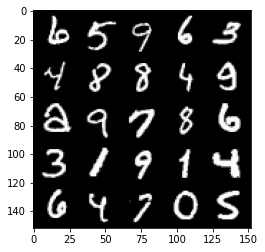

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32500: Generator loss: 2.2864358055591576, discriminator loss: 0.27017421215772625


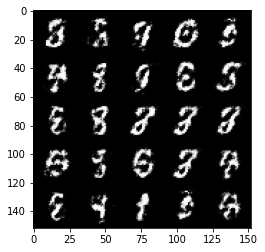

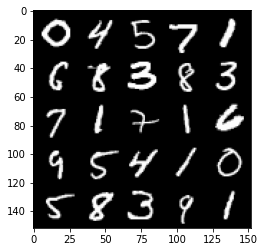

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33000: Generator loss: 2.2503748021125793, discriminator loss: 0.27952490943670283


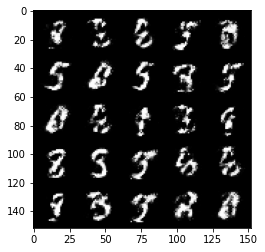

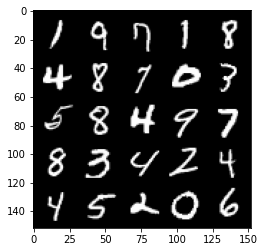

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33500: Generator loss: 2.2396293475627913, discriminator loss: 0.28503960421681424


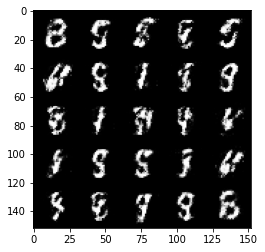

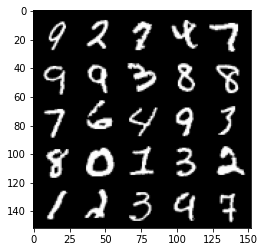

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34000: Generator loss: 2.1199156696796426, discriminator loss: 0.3046589120626448


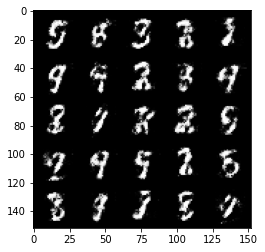

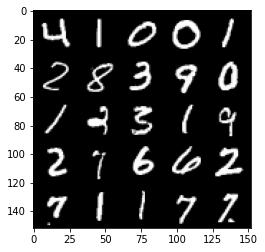

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34500: Generator loss: 2.322921562433243, discriminator loss: 0.26195617181062697


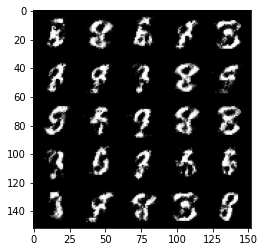

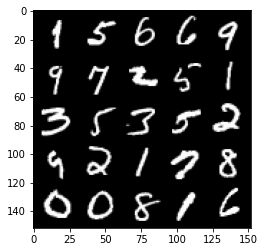

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35000: Generator loss: 2.2230908999443058, discriminator loss: 0.28056560161709787


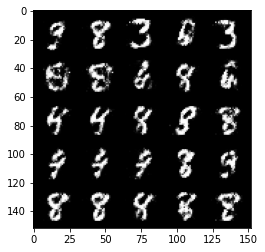

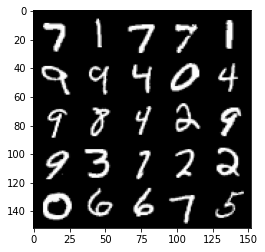

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35500: Generator loss: 2.321922519922256, discriminator loss: 0.25975447425246245


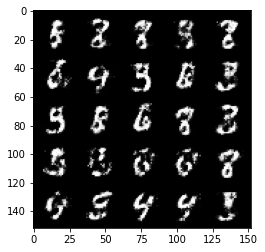

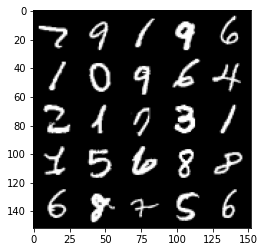

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36000: Generator loss: 2.3370902731418606, discriminator loss: 0.2619386926591397


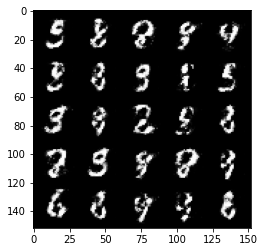

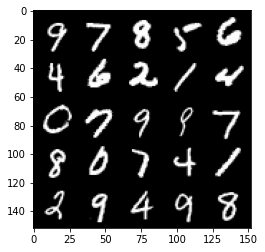

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36500: Generator loss: 2.1435954902172076, discriminator loss: 0.30674102234840395


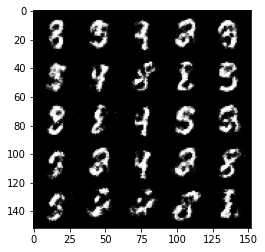

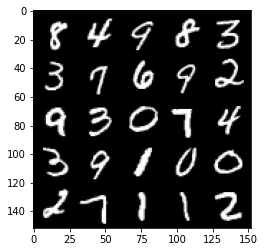

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37000: Generator loss: 2.0656714284420024, discriminator loss: 0.305565728366375


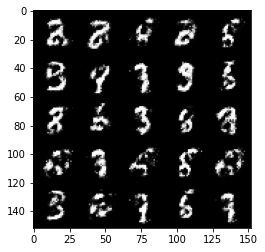

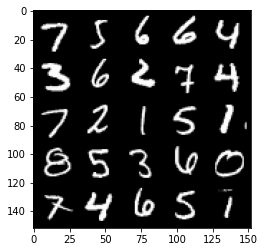

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37500: Generator loss: 2.1805961017608633, discriminator loss: 0.2791870707869528


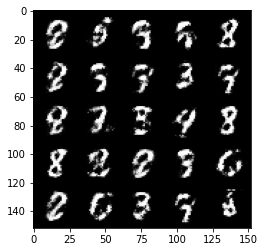

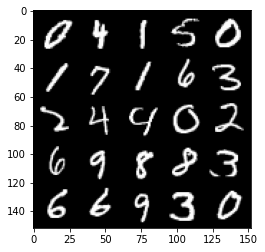

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38000: Generator loss: 2.1340150189399725, discriminator loss: 0.30616940698027595


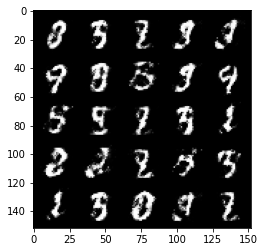

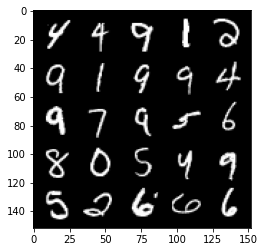

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38500: Generator loss: 2.1932787954807287, discriminator loss: 0.2808797372281551


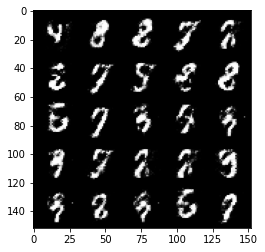

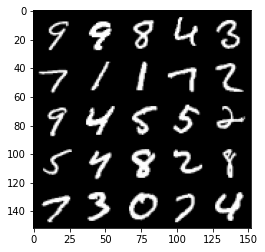

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39000: Generator loss: 2.2246707704067226, discriminator loss: 0.27589795112609866


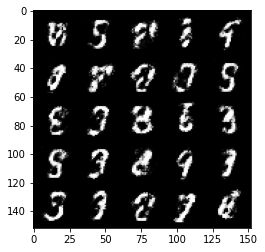

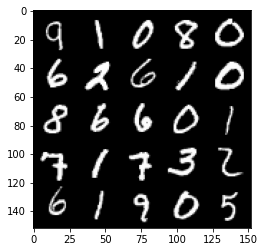

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39500: Generator loss: 2.2654326524734496, discriminator loss: 0.2719523584842679


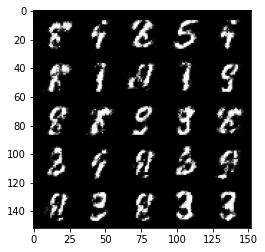

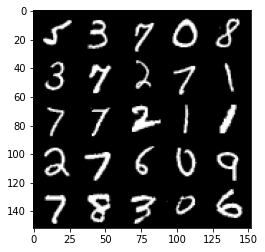

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40000: Generator loss: 2.2264931404590595, discriminator loss: 0.2768651504218577


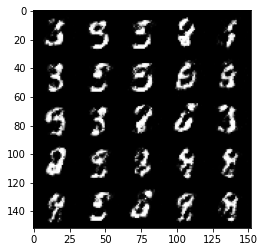

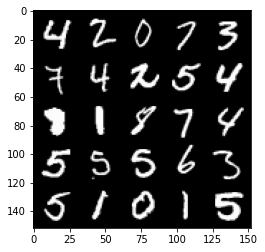

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40500: Generator loss: 2.236625075340268, discriminator loss: 0.2665999648571015


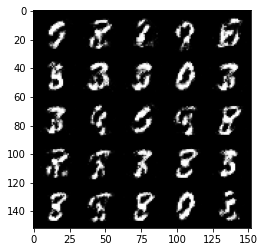

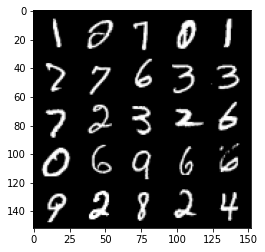

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41000: Generator loss: 2.0742116804122923, discriminator loss: 0.3088328136801722


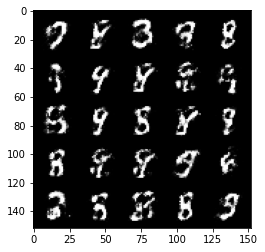

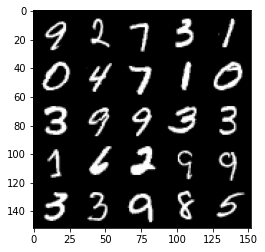

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41500: Generator loss: 2.0871006093025226, discriminator loss: 0.2917476125657562


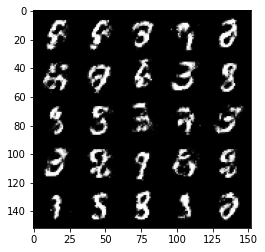

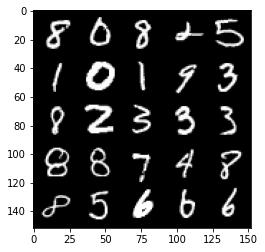

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42000: Generator loss: 2.078265763521193, discriminator loss: 0.30805041369795827


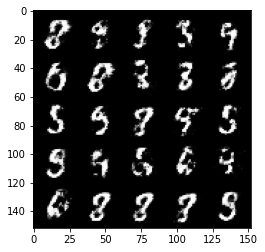

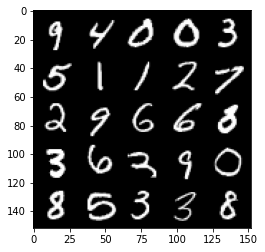

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42500: Generator loss: 2.023412446022034, discriminator loss: 0.3037820170819762


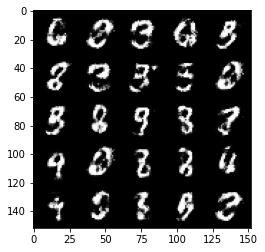

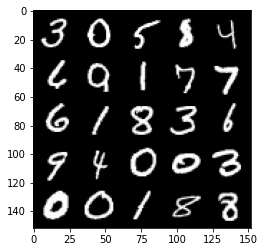

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43000: Generator loss: 2.006277713537217, discriminator loss: 0.31012233024835617


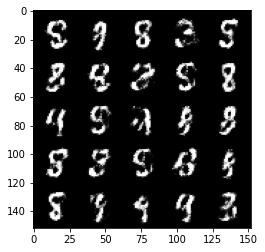

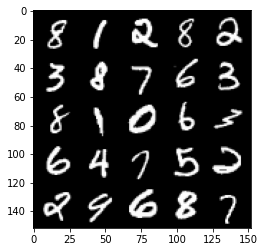

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43500: Generator loss: 2.0976495835781077, discriminator loss: 0.29381456381082544


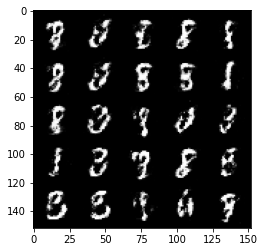

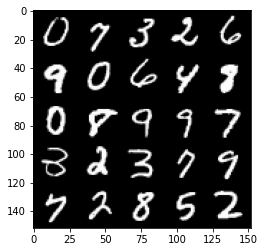

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44000: Generator loss: 2.0748003466129297, discriminator loss: 0.31145915371179583


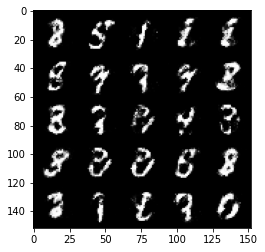

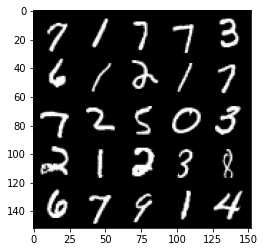

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44500: Generator loss: 1.9464617333412175, discriminator loss: 0.3253364874124531


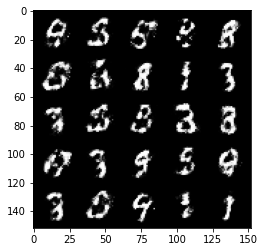

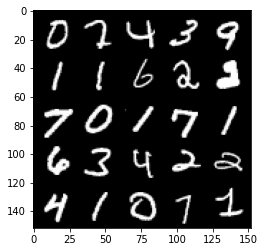

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45000: Generator loss: 1.8698367462158196, discriminator loss: 0.3388840297460555


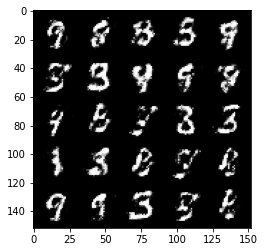

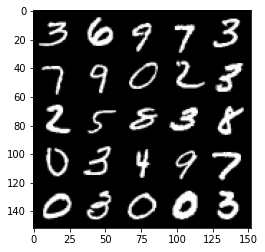

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45500: Generator loss: 1.9466276381015772, discriminator loss: 0.32330110496282605


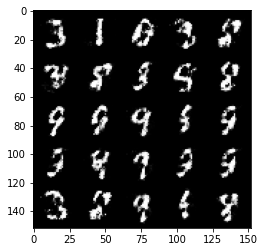

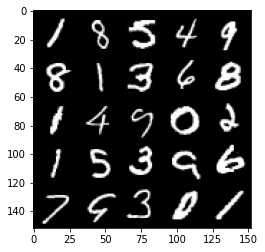

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46000: Generator loss: 1.9955653567314133, discriminator loss: 0.3157488946020601


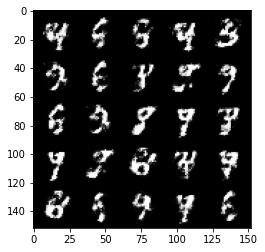

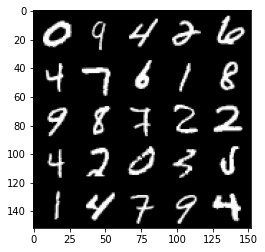

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46500: Generator loss: 1.915401778459547, discriminator loss: 0.332523073941469


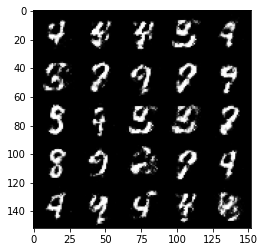

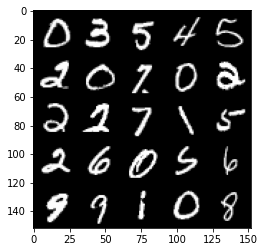

  0%|          | 0/469 [00:00<?, ?it/s]

Step 47000: Generator loss: 1.9137029566764832, discriminator loss: 0.3328774150013921


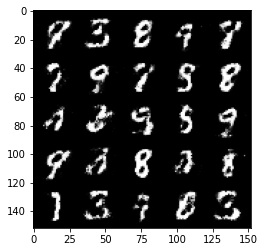

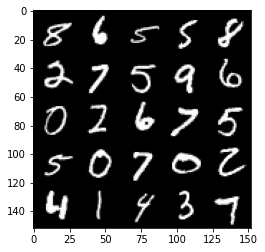

  0%|          | 0/469 [00:00<?, ?it/s]

Step 47500: Generator loss: 1.8593374476432805, discriminator loss: 0.3419689561724665


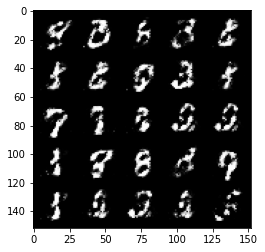

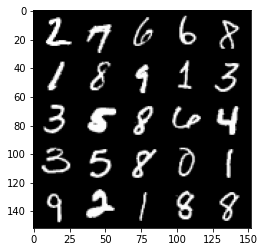

  0%|          | 0/469 [00:00<?, ?it/s]

Step 48000: Generator loss: 1.8948331284522997, discriminator loss: 0.3348981199264525


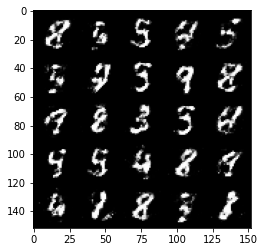

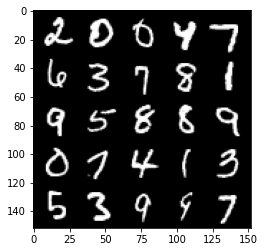

  0%|          | 0/469 [00:00<?, ?it/s]

Step 48500: Generator loss: 1.9103995144367205, discriminator loss: 0.3299016652107239


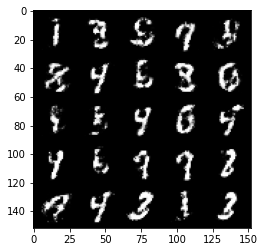

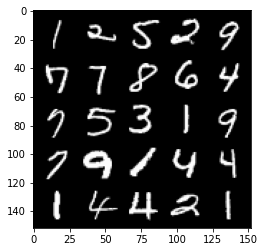

  0%|          | 0/469 [00:00<?, ?it/s]

Step 49000: Generator loss: 1.7851545286178596, discriminator loss: 0.36623181957006434


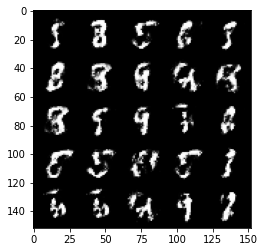

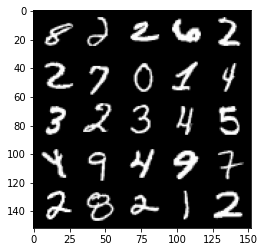

  0%|          | 0/469 [00:00<?, ?it/s]

Step 49500: Generator loss: 1.9432114658355735, discriminator loss: 0.31793577623367314


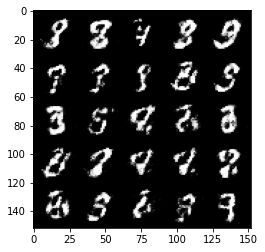

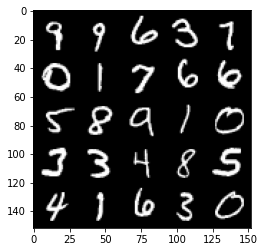

  0%|          | 0/469 [00:00<?, ?it/s]

Step 50000: Generator loss: 1.8959360971450807, discriminator loss: 0.32824771896004684


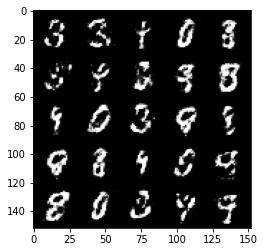

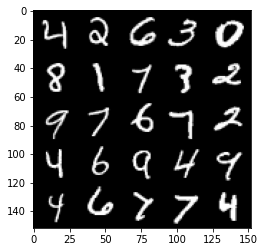

  0%|          | 0/469 [00:00<?, ?it/s]

Step 50500: Generator loss: 1.761337500333786, discriminator loss: 0.3674481314420702


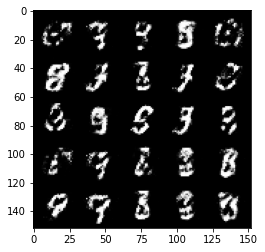

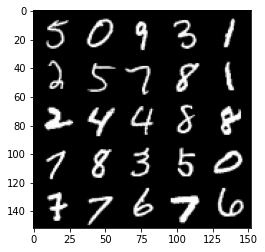

  0%|          | 0/469 [00:00<?, ?it/s]

Step 51000: Generator loss: 1.7632666070461263, discriminator loss: 0.3687065085768699


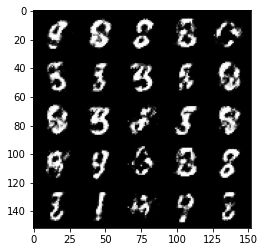

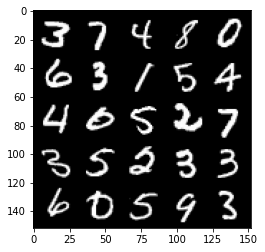

  0%|          | 0/469 [00:00<?, ?it/s]

Step 51500: Generator loss: 1.8241850178241725, discriminator loss: 0.3474968020021917


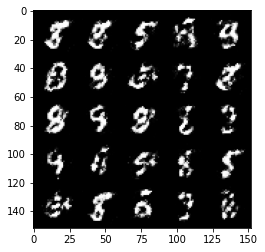

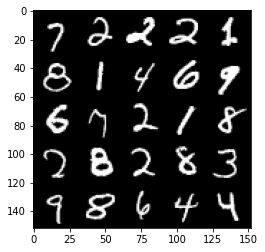

  0%|          | 0/469 [00:00<?, ?it/s]

Step 52000: Generator loss: 1.8105762479305256, discriminator loss: 0.35103536394238466


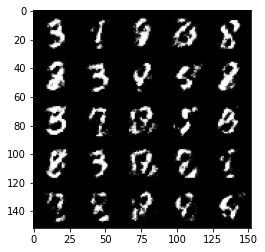

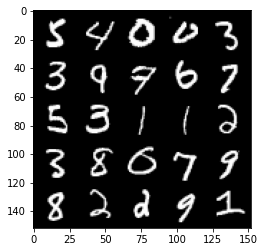

  0%|          | 0/469 [00:00<?, ?it/s]

Step 52500: Generator loss: 1.7905758366584787, discriminator loss: 0.3572605760693552


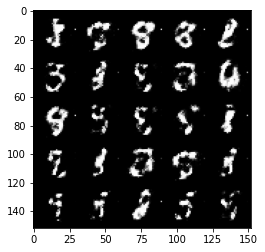

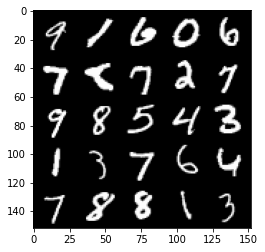

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 53000: Generator loss: 1.8541580417156207, discriminator loss: 0.337840854436159


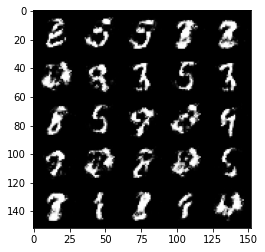

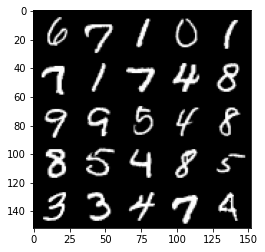

  0%|          | 0/469 [00:00<?, ?it/s]

Step 53500: Generator loss: 1.7721530711650841, discriminator loss: 0.3677004956603053


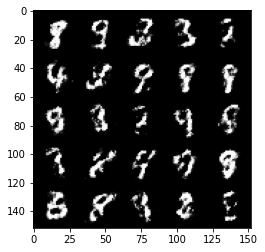

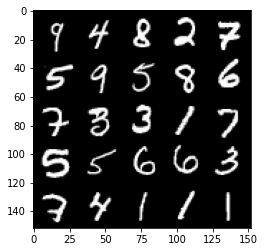

  0%|          | 0/469 [00:00<?, ?it/s]

Step 54000: Generator loss: 1.7229335269927966, discriminator loss: 0.3751824288368227


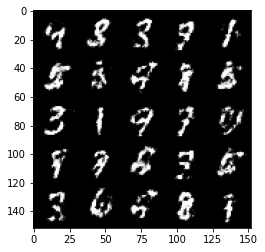

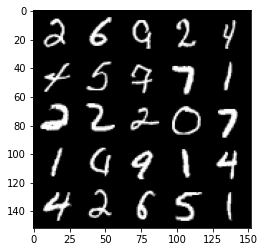

  0%|          | 0/469 [00:00<?, ?it/s]

Step 54500: Generator loss: 1.6683823678493492, discriminator loss: 0.3751622496247293


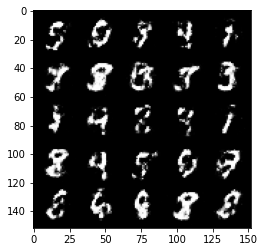

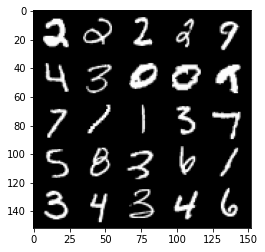

  0%|          | 0/469 [00:00<?, ?it/s]

Step 55000: Generator loss: 1.7483185038566595, discriminator loss: 0.35877117264270814


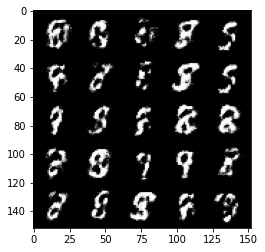

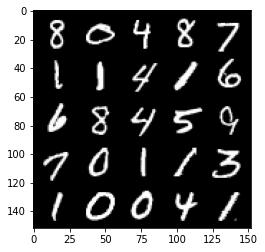

  0%|          | 0/469 [00:00<?, ?it/s]

Step 55500: Generator loss: 1.7036238017082217, discriminator loss: 0.37261933702230454


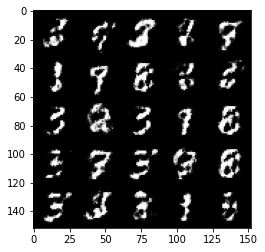

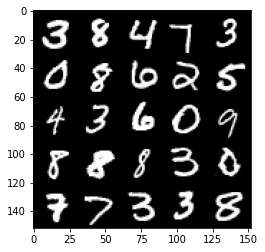

  0%|          | 0/469 [00:00<?, ?it/s]

Step 56000: Generator loss: 1.9185381762981424, discriminator loss: 0.33257468459010125


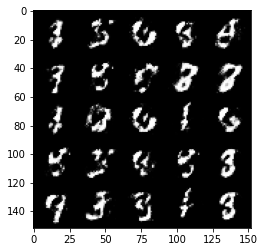

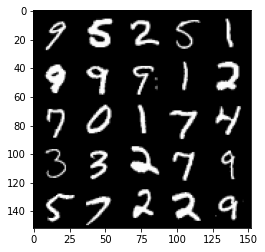

  0%|          | 0/469 [00:00<?, ?it/s]

Step 56500: Generator loss: 1.7045872001647941, discriminator loss: 0.38706182205677014


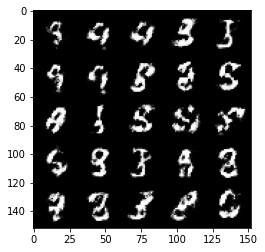

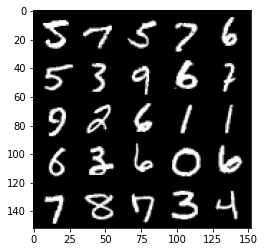

  0%|          | 0/469 [00:00<?, ?it/s]

Step 57000: Generator loss: 1.6430417060852045, discriminator loss: 0.39934746462106685


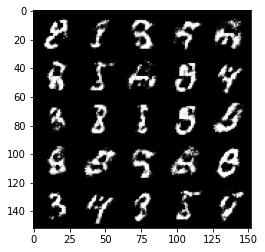

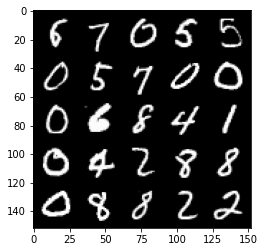

  0%|          | 0/469 [00:00<?, ?it/s]

Step 57500: Generator loss: 1.6550350039005277, discriminator loss: 0.39276303398609147


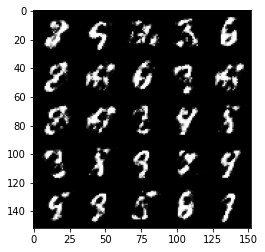

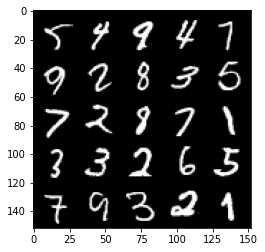

  0%|          | 0/469 [00:00<?, ?it/s]

Step 58000: Generator loss: 1.7057409958839438, discriminator loss: 0.37050000816583645


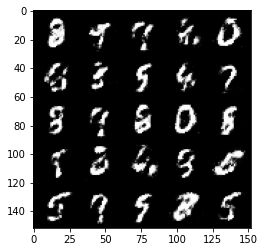

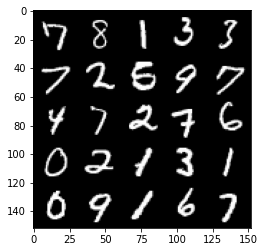

  0%|          | 0/469 [00:00<?, ?it/s]

Step 58500: Generator loss: 1.5919250152111053, discriminator loss: 0.39068947571516033


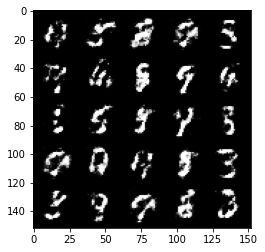

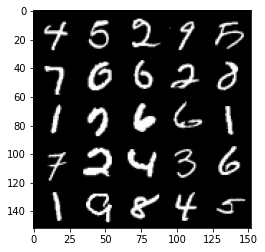

  0%|          | 0/469 [00:00<?, ?it/s]

Step 59000: Generator loss: 1.7273393473625194, discriminator loss: 0.36525453358888693


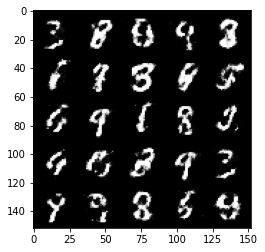

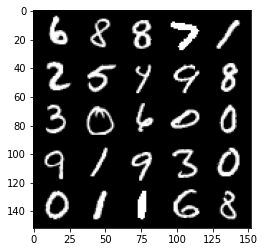

  0%|          | 0/469 [00:00<?, ?it/s]

Step 59500: Generator loss: 1.6394883751869205, discriminator loss: 0.3990321323275566


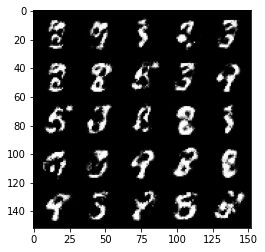

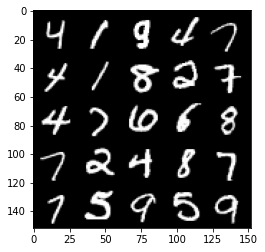

  0%|          | 0/469 [00:00<?, ?it/s]

Step 60000: Generator loss: 1.6658814549446084, discriminator loss: 0.3874368482828141


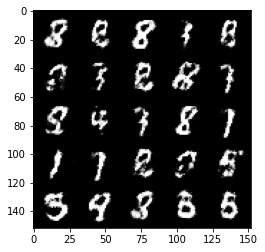

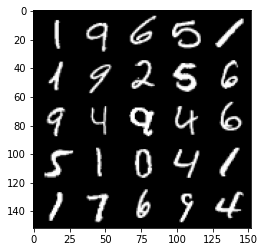

  0%|          | 0/469 [00:00<?, ?it/s]

Step 60500: Generator loss: 1.6389791421890259, discriminator loss: 0.38002890813350687


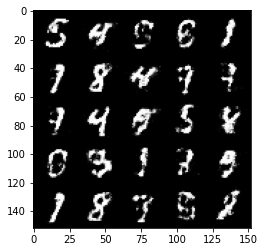

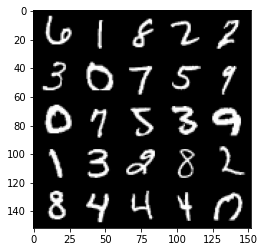

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 61000: Generator loss: 1.5237804195880875, discriminator loss: 0.42635462605953245


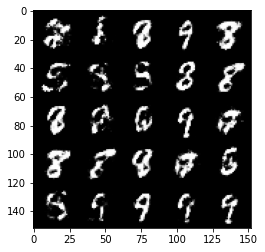

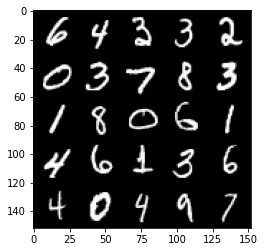

  0%|          | 0/469 [00:00<?, ?it/s]

Step 61500: Generator loss: 1.5220592131614694, discriminator loss: 0.41008591419458423


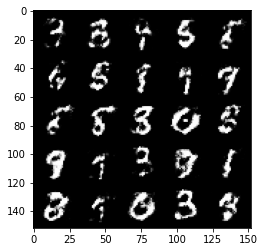

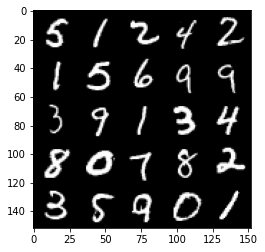

  0%|          | 0/469 [00:00<?, ?it/s]

Step 62000: Generator loss: 1.5374431908130637, discriminator loss: 0.4178629465699194


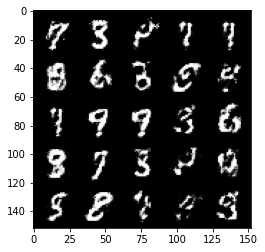

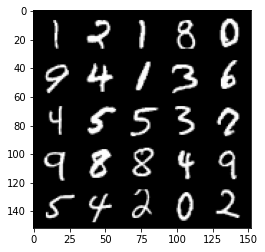

  0%|          | 0/469 [00:00<?, ?it/s]

Step 62500: Generator loss: 1.5664343957901006, discriminator loss: 0.39232939088344587


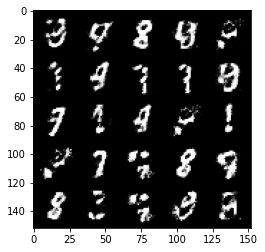

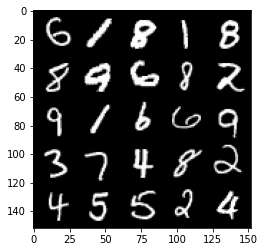

  0%|          | 0/469 [00:00<?, ?it/s]

Step 63000: Generator loss: 1.667275888681413, discriminator loss: 0.37401406812667826


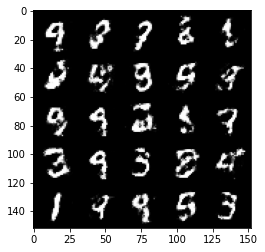

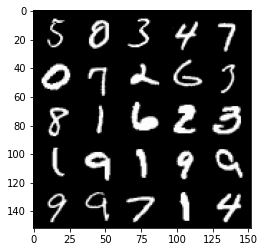

  0%|          | 0/469 [00:00<?, ?it/s]

Step 63500: Generator loss: 1.5914007313251504, discriminator loss: 0.4000761817693707


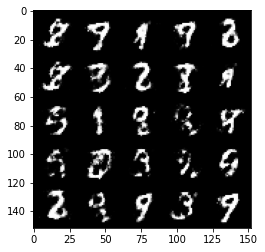

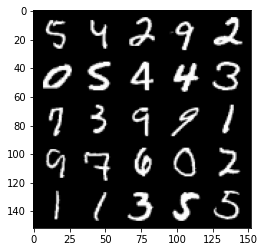

  0%|          | 0/469 [00:00<?, ?it/s]

Step 64000: Generator loss: 1.5812834258079542, discriminator loss: 0.4007991921305656


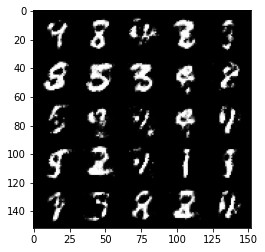

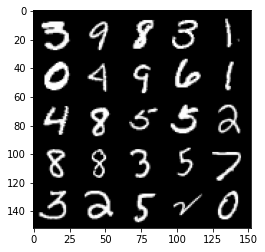

  0%|          | 0/469 [00:00<?, ?it/s]

Step 64500: Generator loss: 1.5568341109752653, discriminator loss: 0.3897389265894891


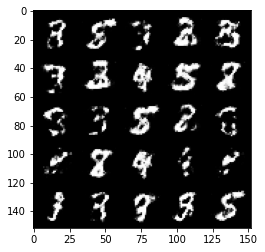

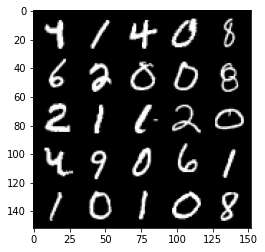

  0%|          | 0/469 [00:00<?, ?it/s]

Step 65000: Generator loss: 1.6415443739891045, discriminator loss: 0.3838271561264991


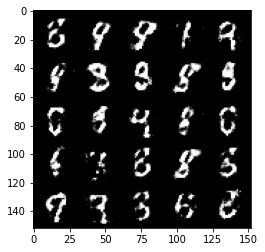

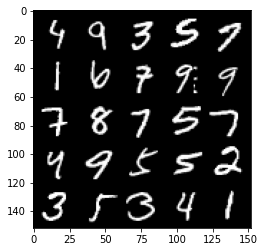

  0%|          | 0/469 [00:00<?, ?it/s]

Step 65500: Generator loss: 1.5818309488296514, discriminator loss: 0.3905314213037493


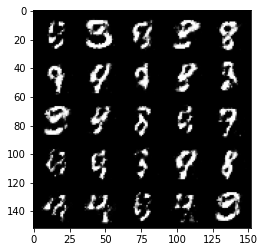

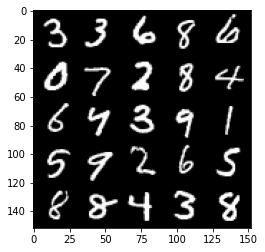

  0%|          | 0/469 [00:00<?, ?it/s]

Step 66000: Generator loss: 1.5776149845123282, discriminator loss: 0.39584962362050974


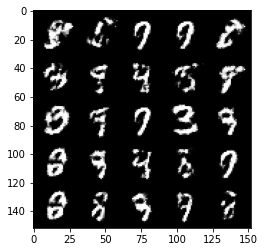

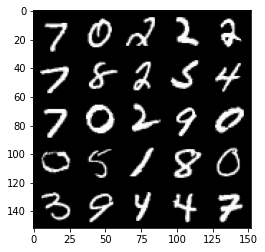

  0%|          | 0/469 [00:00<?, ?it/s]

Step 66500: Generator loss: 1.5882173163890838, discriminator loss: 0.38973504745960214


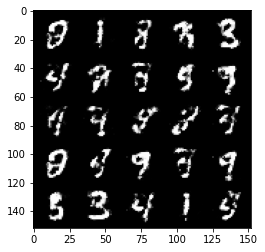

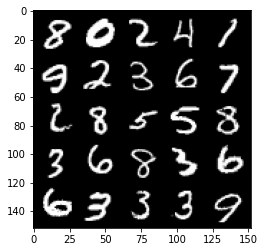

  0%|          | 0/469 [00:00<?, ?it/s]

Step 67000: Generator loss: 1.5518076286315914, discriminator loss: 0.4141093257069588


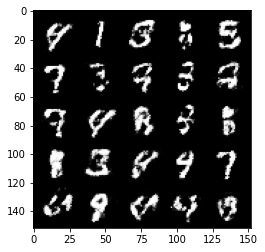

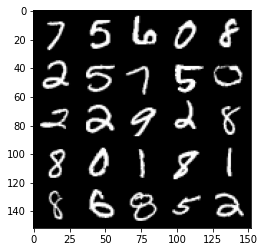

  0%|          | 0/469 [00:00<?, ?it/s]

Step 67500: Generator loss: 1.5334540150165548, discriminator loss: 0.40478438717126797


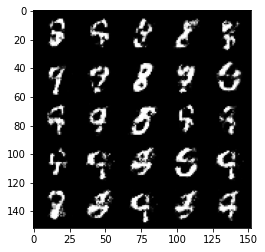

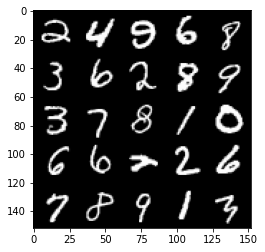

  0%|          | 0/469 [00:00<?, ?it/s]

Step 68000: Generator loss: 1.5148664944171892, discriminator loss: 0.4060633912086487


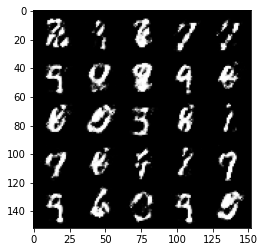

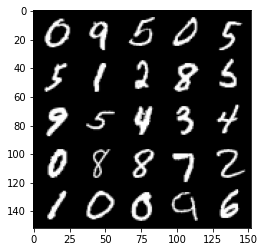

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 68500: Generator loss: 1.5410719182491308, discriminator loss: 0.3958354061841966


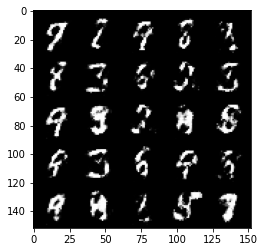

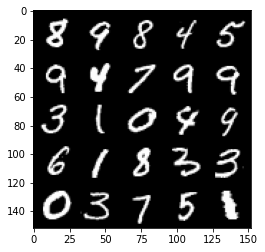

  0%|          | 0/469 [00:00<?, ?it/s]

Step 69000: Generator loss: 1.57140302348137, discriminator loss: 0.39441524332761757


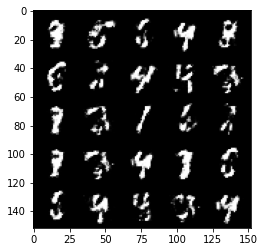

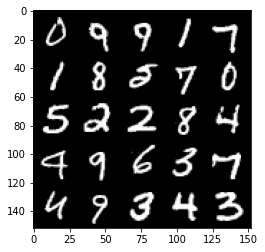

  0%|          | 0/469 [00:00<?, ?it/s]

Step 69500: Generator loss: 1.5684455447196963, discriminator loss: 0.40505654656887097


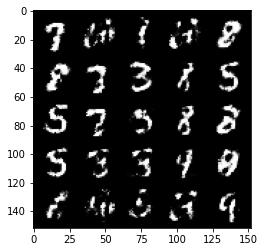

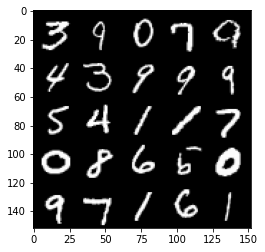

  0%|          | 0/469 [00:00<?, ?it/s]

Step 70000: Generator loss: 1.4986617758274086, discriminator loss: 0.4145978129506107


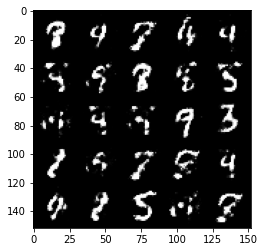

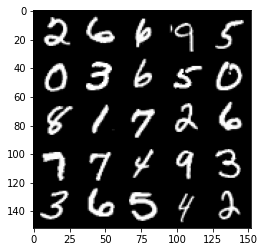

  0%|          | 0/469 [00:00<?, ?it/s]

Step 70500: Generator loss: 1.5545302615165695, discriminator loss: 0.3962975924015049


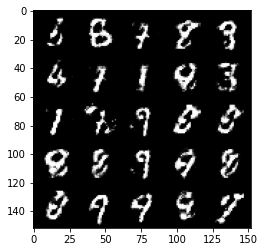

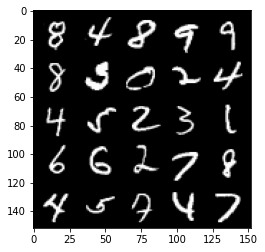

  0%|          | 0/469 [00:00<?, ?it/s]

Step 71000: Generator loss: 1.503466765880585, discriminator loss: 0.44129977273941023


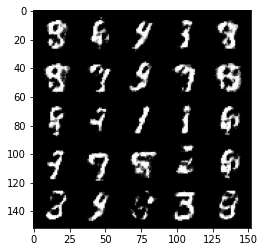

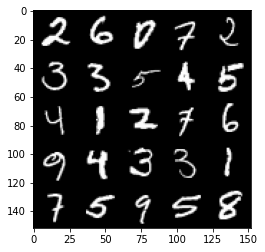

  0%|          | 0/469 [00:00<?, ?it/s]

Step 71500: Generator loss: 1.4542887544631953, discriminator loss: 0.43679717224836323


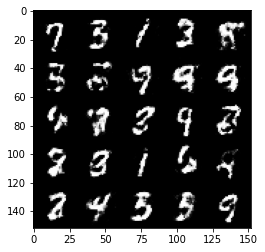

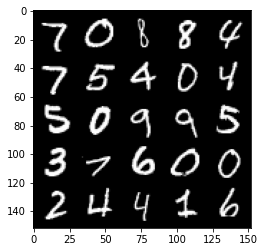

  0%|          | 0/469 [00:00<?, ?it/s]

Step 72000: Generator loss: 1.5072879662513736, discriminator loss: 0.4259937282800677


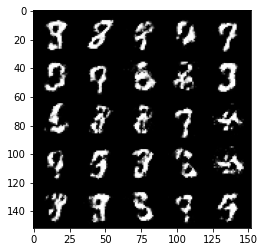

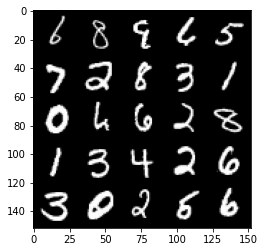

  0%|          | 0/469 [00:00<?, ?it/s]

Step 72500: Generator loss: 1.480942610979083, discriminator loss: 0.4352901097536085


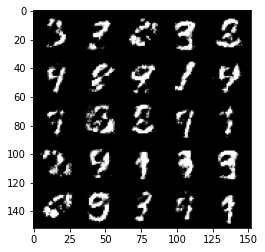

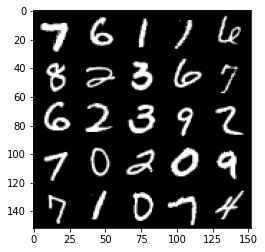

  0%|          | 0/469 [00:00<?, ?it/s]

Step 73000: Generator loss: 1.4417540385723115, discriminator loss: 0.44173603522777527


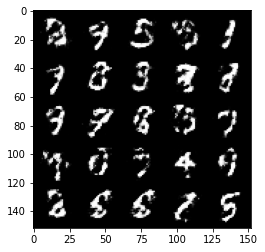

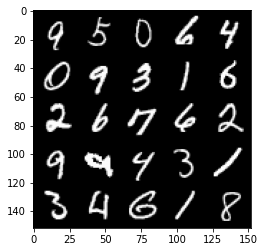

  0%|          | 0/469 [00:00<?, ?it/s]

Step 73500: Generator loss: 1.4527458329200753, discriminator loss: 0.4354843788146975


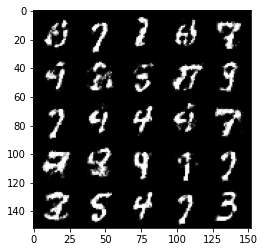

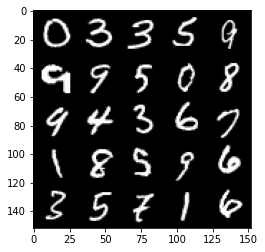

  0%|          | 0/469 [00:00<?, ?it/s]

Step 74000: Generator loss: 1.3591254942417135, discriminator loss: 0.46033648151159273


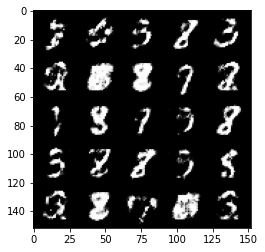

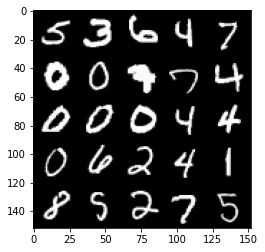

  0%|          | 0/469 [00:00<?, ?it/s]

Step 74500: Generator loss: 1.2822033655643468, discriminator loss: 0.47761954092979403


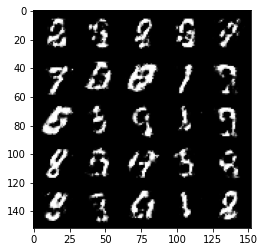

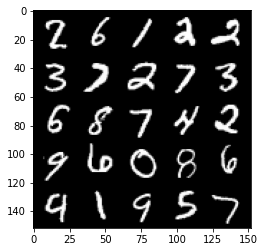

  0%|          | 0/469 [00:00<?, ?it/s]

Step 75000: Generator loss: 1.293395078420639, discriminator loss: 0.4658329271674156


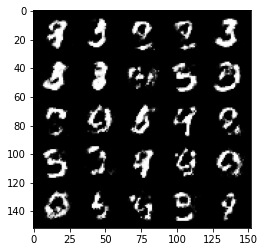

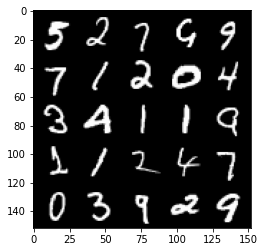

  0%|          | 0/469 [00:00<?, ?it/s]

Step 75500: Generator loss: 1.4471655769348142, discriminator loss: 0.43458331495523506


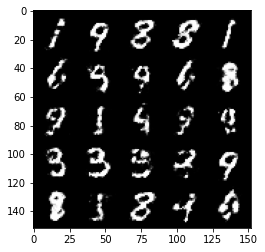

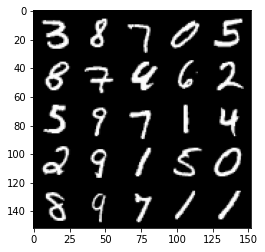

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 76000: Generator loss: 1.3641532664299, discriminator loss: 0.44649848812818527


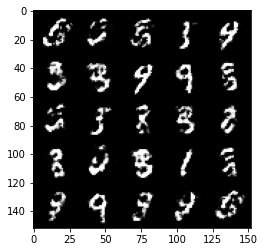

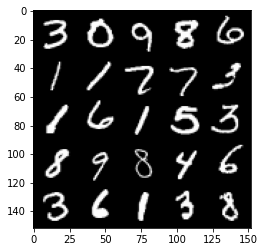

  0%|          | 0/469 [00:00<?, ?it/s]

Step 76500: Generator loss: 1.3701312456130983, discriminator loss: 0.45089738756418235


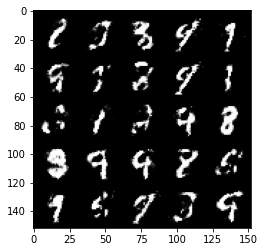

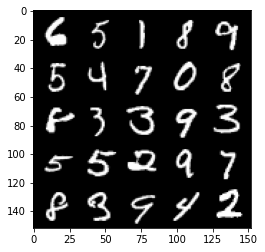

  0%|          | 0/469 [00:00<?, ?it/s]

Step 77000: Generator loss: 1.381983202695847, discriminator loss: 0.44398576432466536


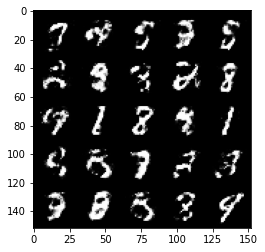

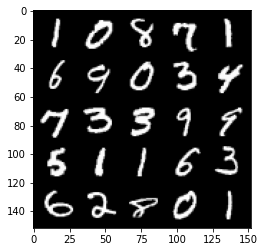

  0%|          | 0/469 [00:00<?, ?it/s]

Step 77500: Generator loss: 1.3628880128860477, discriminator loss: 0.45060430157184594


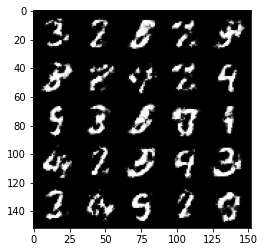

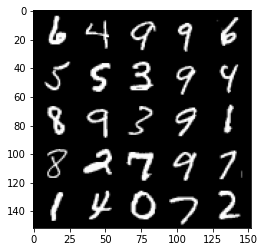

  0%|          | 0/469 [00:00<?, ?it/s]

Step 78000: Generator loss: 1.3948388295173646, discriminator loss: 0.43862785011529926


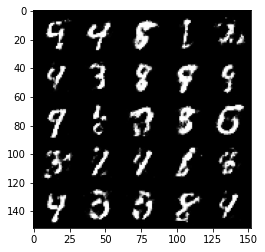

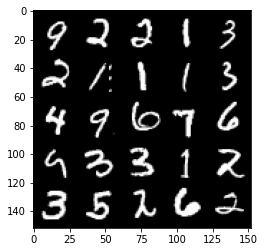

  0%|          | 0/469 [00:00<?, ?it/s]

Step 78500: Generator loss: 1.362004985570908, discriminator loss: 0.4601494774818424


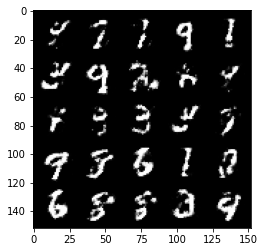

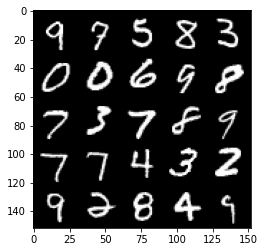

  0%|          | 0/469 [00:00<?, ?it/s]

Step 79000: Generator loss: 1.3576382927894595, discriminator loss: 0.45902478414773956


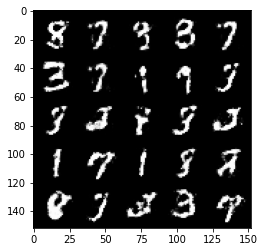

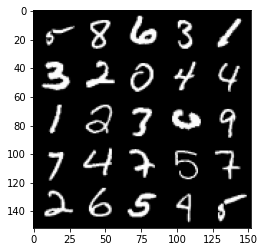

  0%|          | 0/469 [00:00<?, ?it/s]

Step 79500: Generator loss: 1.3923082416057586, discriminator loss: 0.44198114025592766


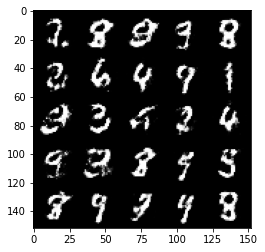

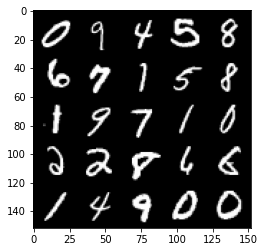

  0%|          | 0/469 [00:00<?, ?it/s]

Step 80000: Generator loss: 1.3596317911148075, discriminator loss: 0.45155835753679263


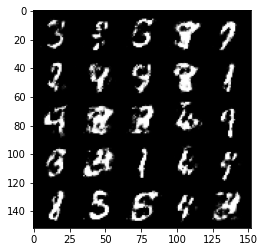

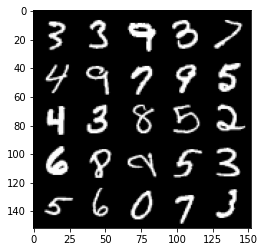

  0%|          | 0/469 [00:00<?, ?it/s]

Step 80500: Generator loss: 1.4067303926944732, discriminator loss: 0.45058115595579157


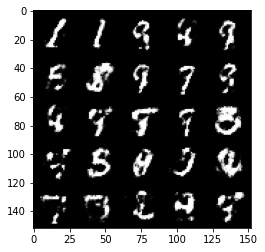

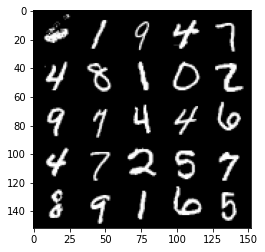

  0%|          | 0/469 [00:00<?, ?it/s]

Step 81000: Generator loss: 1.3185123400688168, discriminator loss: 0.47520197713375095


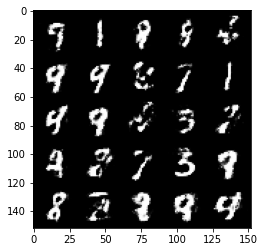

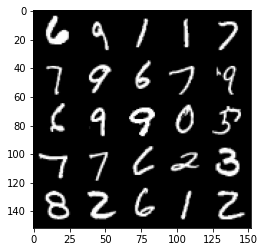

  0%|          | 0/469 [00:00<?, ?it/s]

Step 81500: Generator loss: 1.336667843341826, discriminator loss: 0.4593500239849092


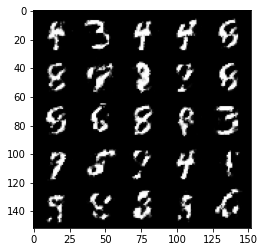

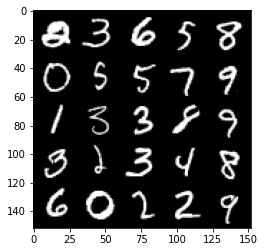

  0%|          | 0/469 [00:00<?, ?it/s]

Step 82000: Generator loss: 1.3532378144264217, discriminator loss: 0.45890537953376764


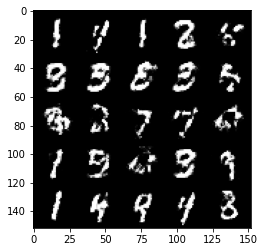

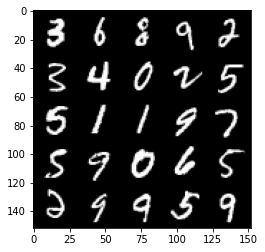

  0%|          | 0/469 [00:00<?, ?it/s]

Step 82500: Generator loss: 1.320387625217437, discriminator loss: 0.4618301691412924


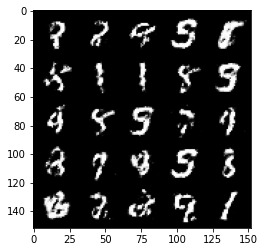

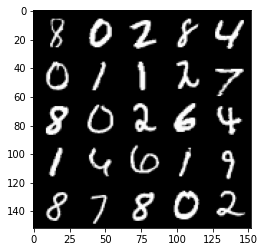

  0%|          | 0/469 [00:00<?, ?it/s]

Step 83000: Generator loss: 1.3355839571952826, discriminator loss: 0.4608146434426308


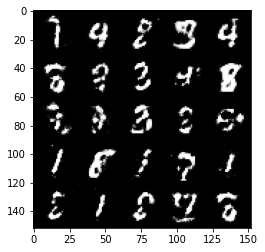

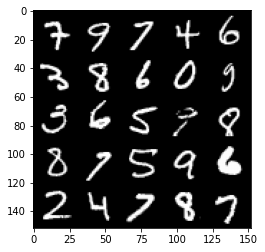

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 83500: Generator loss: 1.3019583246707913, discriminator loss: 0.4684322022795676


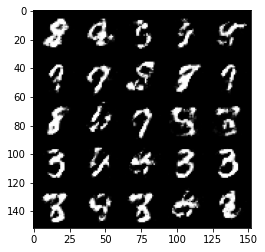

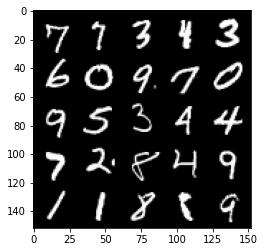

  0%|          | 0/469 [00:00<?, ?it/s]

Step 84000: Generator loss: 1.2072246814966205, discriminator loss: 0.49315283566713347


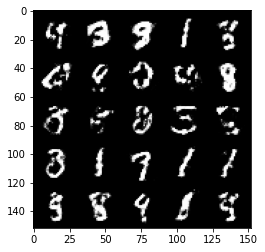

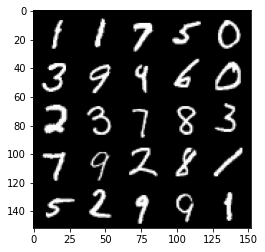

  0%|          | 0/469 [00:00<?, ?it/s]

Step 84500: Generator loss: 1.2938569128513342, discriminator loss: 0.4568020445704459


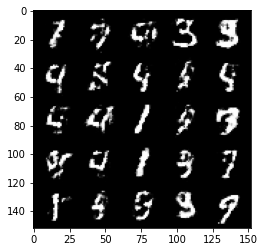

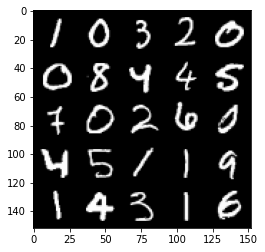

  0%|          | 0/469 [00:00<?, ?it/s]

Step 85000: Generator loss: 1.2768615541458141, discriminator loss: 0.47752969235181786


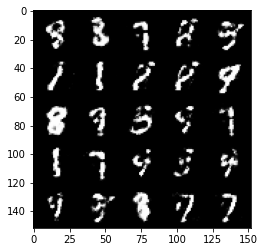

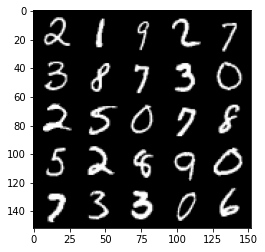

  0%|          | 0/469 [00:00<?, ?it/s]

Step 85500: Generator loss: 1.2635936918258677, discriminator loss: 0.467410190522671


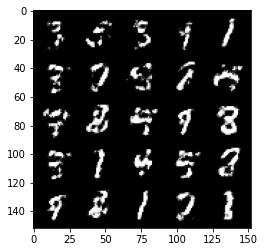

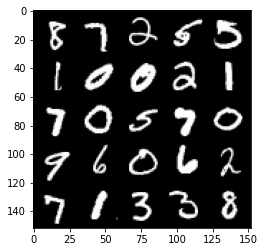

  0%|          | 0/469 [00:00<?, ?it/s]

Step 86000: Generator loss: 1.2335650229454043, discriminator loss: 0.5053703470826149


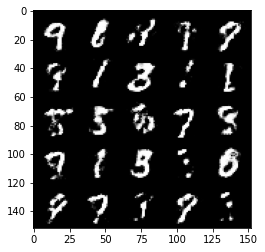

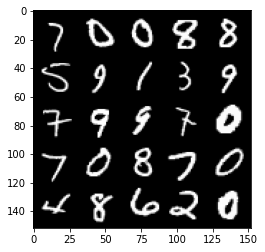

  0%|          | 0/469 [00:00<?, ?it/s]

Step 86500: Generator loss: 1.2099305670261378, discriminator loss: 0.49732287764549266


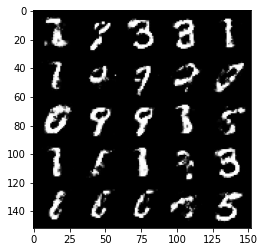

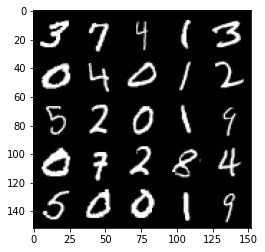

  0%|          | 0/469 [00:00<?, ?it/s]

Step 87000: Generator loss: 1.2248300054073347, discriminator loss: 0.4922207136154176


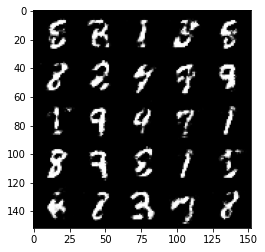

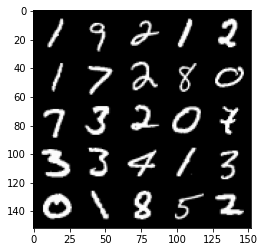

  0%|          | 0/469 [00:00<?, ?it/s]

Step 87500: Generator loss: 1.2646659612655622, discriminator loss: 0.4826738713979722


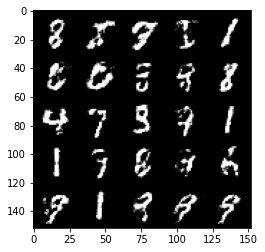

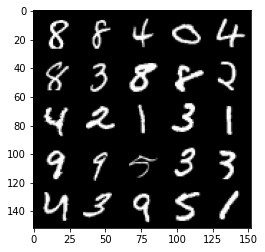

  0%|          | 0/469 [00:00<?, ?it/s]

Step 88000: Generator loss: 1.2213440029621134, discriminator loss: 0.4898178155422213


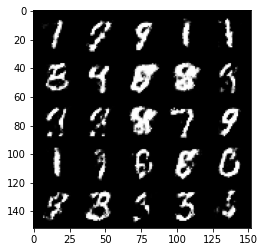

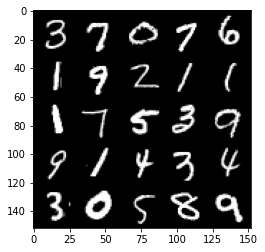

  0%|          | 0/469 [00:00<?, ?it/s]

Step 88500: Generator loss: 1.1869223290681847, discriminator loss: 0.49436475002765706


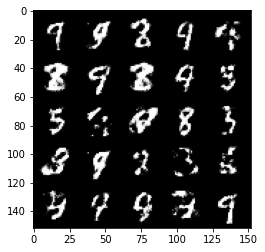

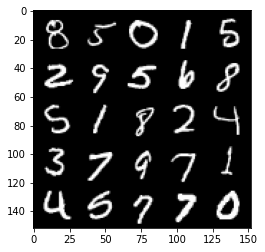

  0%|          | 0/469 [00:00<?, ?it/s]

Step 89000: Generator loss: 1.2643813009262095, discriminator loss: 0.4649779678583148


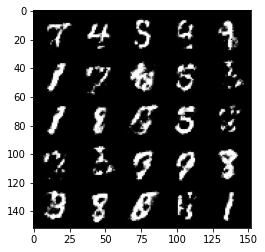

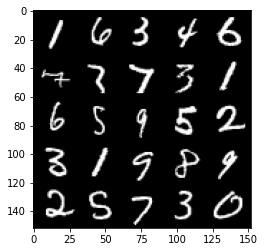

  0%|          | 0/469 [00:00<?, ?it/s]

Step 89500: Generator loss: 1.2054743185043344, discriminator loss: 0.5016172047257428


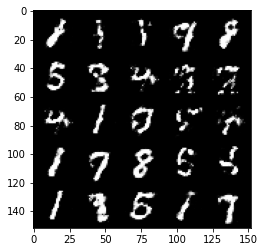

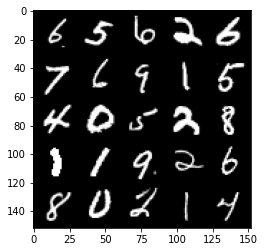

  0%|          | 0/469 [00:00<?, ?it/s]

Step 90000: Generator loss: 1.1768810396194451, discriminator loss: 0.4958941504955291


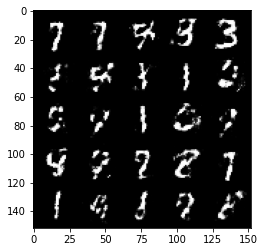

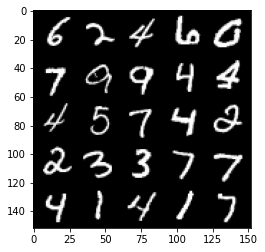

  0%|          | 0/469 [00:00<?, ?it/s]

Step 90500: Generator loss: 1.2246770770549764, discriminator loss: 0.48833034473657605


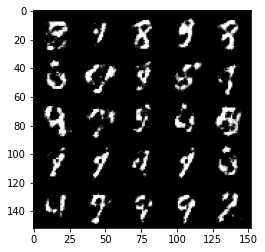

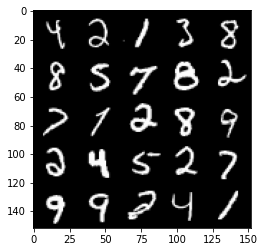

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 91000: Generator loss: 1.2538067271709448, discriminator loss: 0.4860913831591603


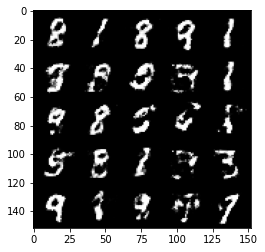

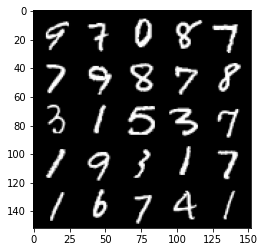

  0%|          | 0/469 [00:00<?, ?it/s]

Step 91500: Generator loss: 1.2299495532512663, discriminator loss: 0.4884226976633071


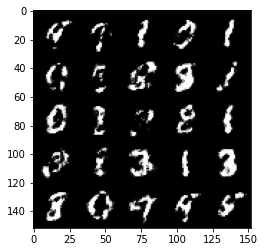

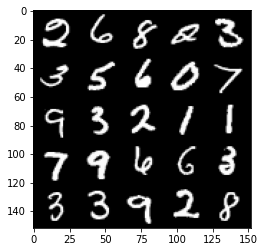

  0%|          | 0/469 [00:00<?, ?it/s]

Step 92000: Generator loss: 1.200385738849641, discriminator loss: 0.4848917310237884


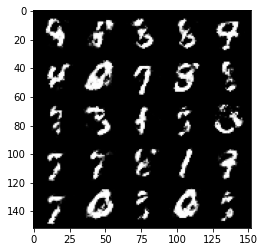

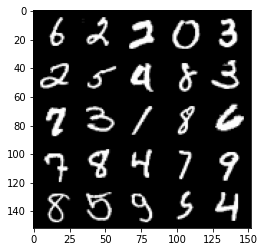

  0%|          | 0/469 [00:00<?, ?it/s]

Step 92500: Generator loss: 1.2418743870258335, discriminator loss: 0.4829899999499323


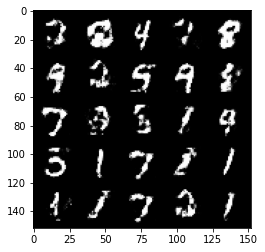

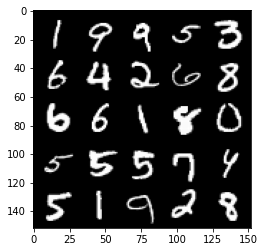

  0%|          | 0/469 [00:00<?, ?it/s]

Step 93000: Generator loss: 1.195344261407853, discriminator loss: 0.5068259812593454


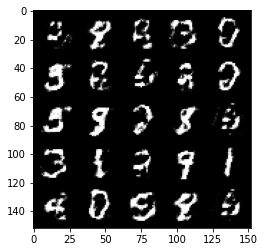

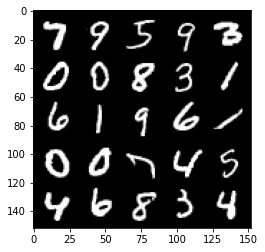

  0%|          | 0/469 [00:00<?, ?it/s]

Step 93500: Generator loss: 1.1869049499034865, discriminator loss: 0.5106413086652756


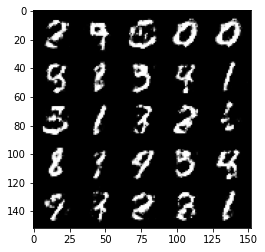

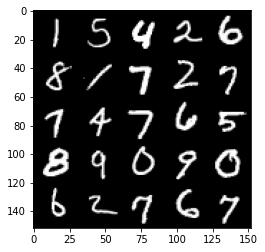

In [16]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
